In [1]:
# Untuk manipulasi dan visualisasi data
import os
import re
import cv2
import tarfile
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
import warnings
warnings.filterwarnings("ignore")

# Data Understanding

In [ ]:
MAIN_DIR = "/content/drive/MyDrive/Capstone"
os.chdir(MAIN_DIR)

In [ ]:
df = pd.read_csv("_annotations.csv")

In [ ]:
df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,1920,1080,float-trash,527,323,641,475
1,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,1920,1080,float-trash,814,390,872,448
2,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,1920,1080,float-trash,1558,475,1620,569
3,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,1920,1080,float-trash,1844,613,1906,691
4,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,1920,1080,float-trash,1291,678,1385,751
...,...,...,...,...,...,...,...,...
2438,frame2472_jpg.rf.5bb4b5a24d22e58647d42c40c72ef...,1440,1440,float-trash,183,513,262,613
2439,frame2472_jpg.rf.5bb4b5a24d22e58647d42c40c72ef...,1440,1440,float-trash,320,520,516,612
2440,frame2472_jpg.rf.5bb4b5a24d22e58647d42c40c72ef...,1440,1440,float-trash,390,568,511,703
2441,frame2472_jpg.rf.5bb4b5a24d22e58647d42c40c72ef...,1440,1440,float-trash,128,678,345,905


In [ ]:
df.shape

(2443, 8)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2443 entries, 0 to 2442
Data columns (total 8 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   filename  2443 non-null   object
 1   width     2443 non-null   int64 
 2   height    2443 non-null   int64 
 3   class     2443 non-null   object
 4   xmin      2443 non-null   int64 
 5   ymin      2443 non-null   int64 
 6   xmax      2443 non-null   int64 
 7   ymax      2443 non-null   int64 
dtypes: int64(6), object(2)
memory usage: 152.8+ KB


In [ ]:
# Mengkomversi dari Standard ke YOLO format
df["box_width"] = df["xmax"] - df["xmin"]
df["box_height"] = df["ymax"] - df["ymin"]
df["center_x"] = df["xmin"] + df["box_width"]/2
df["center_y"] = df["ymin"] + df["box_height"]/2

# Melakukan normalisasi
df["box_width_norm"] = df["box_width"] / df["width"]
df["box_height_norm"] = df["box_height"] / df["height"]
df["center_x_norm"] = df["center_x"] / df["width"]
df["center_y_norm"] = df["center_y"] / df["height"]

# Melakukan resize ke 416x416
df_resize = df.copy()
df_resize["box_width"] = np.ceil(df_resize["box_width_norm"] * 416).astype("int")
df_resize["box_height"] = np.ceil(df_resize["box_height_norm"] * 416).astype("int")
df_resize["center_x"] = np.ceil(df_resize["center_x_norm"] * 416).astype("int")
df_resize["center_y"] = np.ceil(df_resize["center_y_norm"] * 416).astype("int")

# Mengambil dimensi masing-masing gambar
df["size"] = df["width"].astype("str") + "x" + df["height"].astype("str")
df["area"] = df["box_width"] * df["box_height"]

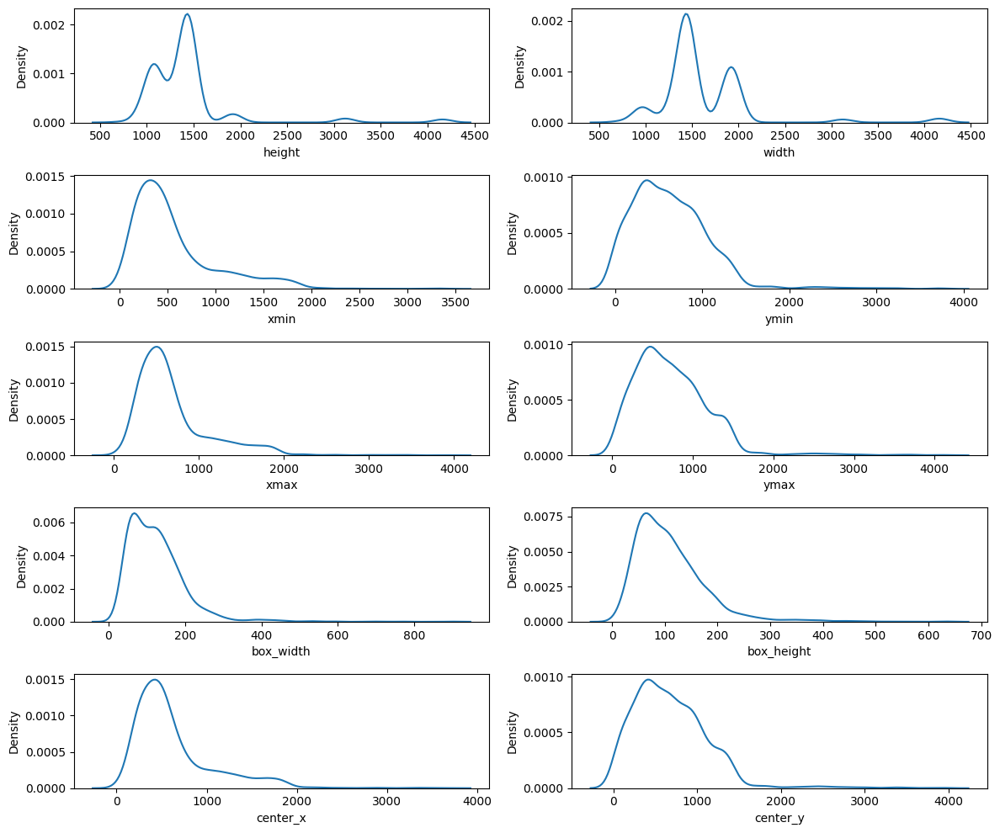

In [ ]:
# Melakukan visualisasi distribusi
fig, ax = plt.subplots(5, 2, figsize = (12, 10))
ax = ax.flatten()
cols = ["height", "width", "xmin", "ymin", "xmax", "ymax",
        "box_width", "box_height", "center_x", "center_y"]

for i, j in enumerate(cols):
  sns.kdeplot(df[j], ax = ax[i])
plt.tight_layout()

<Axes: xlabel='count', ylabel='Density'>

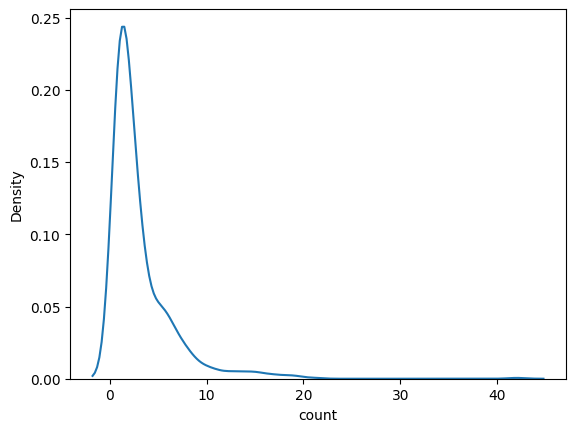

In [ ]:
# Melihat jumlah bounding box/waste per gambar
sns.kdeplot(df["filename"].value_counts())

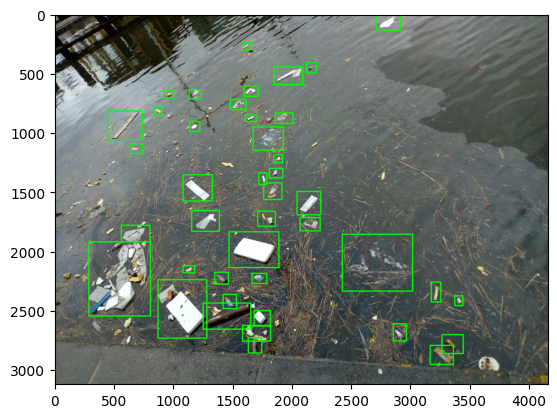

In [ ]:
# Mencoba visualisasi image dengan bounding box in YOLO Format
top5_max = ["pic--119-_jpg.rf.bb016168aa5a5bfd98acaea8163efbf2.jpg", "pic--958-_jpg.rf.8fe0fa54af316f0c059451b71934c801.jpg",
            "pic--133-_jpg.rf.8de8d7af53db5e535f8409a004cede63.jpg", "pic--965-_jpg.rf.746e947e15ef722e54e415a1021f16bc.jpg",
            "pic--961-_jpg.rf.7f1bc9d4b2333bb017cf600e4fca5f9d.jpg"]

# Mengambil gambar contoh
index = 0
img = cv2.imread(top5_max[index])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
example = df[df["filename"] == top5_max[index]].reset_index(drop = True)

# Melakukan visualisasi
for i in range(example.shape[0]):
  # Mendapatkan koordinat YOLO format
  box_width, box_height, center_x, center_y = example.iloc[i, 8:12]

  # Mengkonversi menjadi top-left dan bottom-right coordinates
  x1 = int(center_x - box_width / 2)
  y1 = int(center_y - box_height / 2)
  x2 = int(center_x + box_width / 2)
  y2 = int(center_y + box_height / 2)

  # Menggambar bounding box
  cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 10)

# Menampilkan gambar
plt.imshow(img)
plt.show()

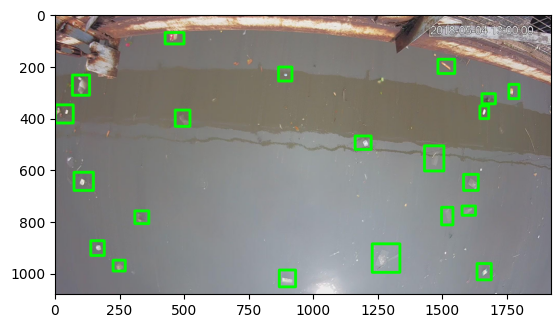

In [ ]:
# Mencoba visualisasi image dengan bounding box in Stanard Format
top5_max = ["pic--119-_jpg.rf.bb016168aa5a5bfd98acaea8163efbf2.jpg", "pic--958-_jpg.rf.8fe0fa54af316f0c059451b71934c801.jpg",
            "pic--133-_jpg.rf.8de8d7af53db5e535f8409a004cede63.jpg", "pic--965-_jpg.rf.746e947e15ef722e54e415a1021f16bc.jpg",
            "pic--961-_jpg.rf.7f1bc9d4b2333bb017cf600e4fca5f9d.jpg"]

# Mengambil gambar contoh
index = 1
img = cv2.imread(top5_max[index])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
example = df[df["filename"] == top5_max[index]].reset_index(drop = True)

# Melakukan visualisasi
for i in range(example.shape[0]):
  # Mendapatkan koordinat YOLO format
  xmin, ymin, xmax, ymax = example.iloc[i, 4:8]

  # Menggambar bounding box
  cv2.rectangle(img, (xmin, ymin), (xmax, ymax), (0, 255, 0), 10)

# Menampilkan gambar
plt.imshow(img)
plt.show()

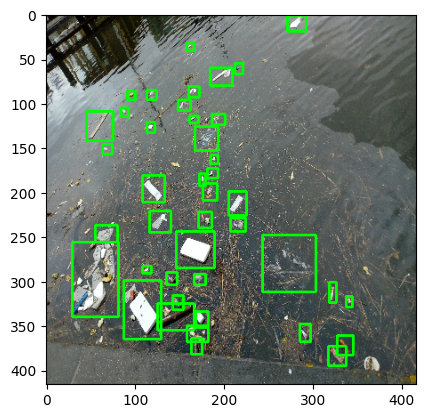

In [ ]:
# Mencoba visualisasi image dengan bounding box in YOLO Format
top5_max = ["pic--119-_jpg.rf.bb016168aa5a5bfd98acaea8163efbf2.jpg", "pic--958-_jpg.rf.8fe0fa54af316f0c059451b71934c801.jpg",
            "pic--133-_jpg.rf.8de8d7af53db5e535f8409a004cede63.jpg", "pic--965-_jpg.rf.746e947e15ef722e54e415a1021f16bc.jpg",
            "pic--961-_jpg.rf.7f1bc9d4b2333bb017cf600e4fca5f9d.jpg"]

# Mengambil gambar contoh
index = 0
img = cv2.imread(top5_max[index])
img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
img = cv2.resize(img, (416, 416))
example = df_resize[df_resize["filename"] == top5_max[index]].reset_index(drop = True)

# Melakukan visualisasi
for i in range(example.shape[0]):
  # Mendapatkan koordinat YOLO format
  box_width, box_height, center_x, center_y = example.iloc[i, 8:12]

  # Mengkonversi menjadi top-left dan bottom-right coordinates
  x1 = int(center_x - box_width / 2)
  y1 = int(center_y - box_height / 2)
  x2 = int(center_x + box_width / 2)
  y2 = int(center_y + box_height / 2)

  # Menggambar bounding box
  cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)

# Menampilkan gambar
plt.imshow(img)
plt.show()

In [ ]:
# Membuat direktori untuk menyimpan labels
os.mkdir("labels")

In [ ]:
# Membuat navigasi ke labels direktori
os.chdir("labels")

In [ ]:
# Menyimpan normalized bounding box ke txt file
filenames = df["filename"].unique()
for filename in filenames:
  dummy = df[df["filename"] == filename].reset_index(drop = True)
  dummy["class_id"] = 0
  dummy = dummy[["class_id", "center_x_norm", "center_y_norm", "box_width_norm", "box_height_norm"]]
  dummy.to_csv(filename[:-4] + ".txt", sep = " ", index = False, header = False)

In [ ]:
# Melakukan navigasi ke MAIN_DIR kembali
os.chdir(MAIN_DIR)

In [ ]:
# Fungsi untuk create labels
def create_labels(path):
  # Melakukuan navigasi ke desired path
  os.chdir(path)

  # Melakukan load dataframe
  df = pd.read_csv("_annotations.csv")

  # Mengkomversi dari Standard ke YOLO format
  df["box_width"] = df["xmax"] - df["xmin"]
  df["box_height"] = df["ymax"] - df["ymin"]
  df["center_x"] = df["xmin"] + df["box_width"]/2
  df["center_y"] = df["ymin"] + df["box_height"]/2

  # Melakukan normalisasi
  df["box_width_norm"] = df["box_width"] / df["width"]
  df["box_height_norm"] = df["box_height"] / df["height"]
  df["center_x_norm"] = df["center_x"] / df["width"]
  df["center_y_norm"] = df["center_y"] / df["height"]

  # Melakukan navigasi ke labels direktori
  os.chdir("labels")

  # Menyimpan normalized bounding box ke txt file
  filenames = df["filename"].unique()
  for filename in filenames:
    dummy = df[df["filename"] == filename].reset_index(drop = True)
    dummy["class_id"] = 0
    dummy = dummy[["class_id", "center_x_norm", "center_y_norm", "box_width_norm", "box_height_norm"]]
    dummy.to_csv(filename[:-4] + ".txt", sep = " ", index = False, header = False)

  # Melakukan navigasi ke MAIN_DIR kembali
  os.chdir(MAIN_DIR)

  return print("Done")

In [ ]:
# Membuat labels sesuai direktori
create_labels("train")
create_labels("valid")
create_labels("test")

Done
Done
Done


In [ ]:
# Mendefinisikan train, val, and test dir
train_dir = os.listdir("train/images")
val_dir = os.listdir("valid/images")
test_dir = os.listdir("test/images")

# Melakukan print jumlah gambar
print(f"Jumlah gambar train: {len(train_dir)}")
print(f"Jumlah gambar val: {len(val_dir)}")
print(f"Jumlah gambar test: {len(test_dir)}")

Jumlah gambar train: 773
Jumlah gambar val: 310
Jumlah gambar test: 462


In [ ]:
# Melihat dimensi masing-masing gambar
df["size"].value_counts()

,count
size,
1440x1440,1242
1920x1080,647
960x1280,181
1440x1920,90
1280x960,75
1920x1440,51
4160x3120,48
3120x4160,37
1279x959,35


<Axes: xlabel='area', ylabel='Density'>

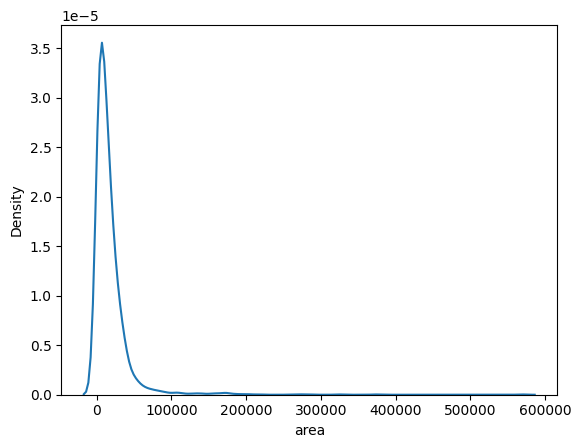

In [ ]:
sns.kdeplot(df["area"])

In [ ]:
# Mendapatkan min/max bounding box
print("Minimum box width: ", df["box_width"].min())
print("Minimum box height: ", df["box_height"].min())
print("Maximum box width: ", df["box_width"].max())
print("Maximum box height: ", df["box_height"].max())

Minimum box width:  6
Minimum box height:  2
Maximum box width:  899
Maximum box height:  633


In [ ]:
# Mendapatkan optimal size supaya objek terkecil berukuran 16x16
print(97/16)
print(68/16)
print(1440/6.0625)
print(1440/4.25)
print("Optimal size: 256x320")

6.0625
4.25
237.5257731958763
338.8235294117647
Optimal size: 256x320


# Data Preparation

In [ ]:
# Menggabungkan train + test
df1 = pd.read_csv("/content/drive/MyDrive/Capstone/train/_annotations.csv")
df2 = pd.read_csv("/content/drive/MyDrive/Capstone/train/_annotations2.csv")
df = pd.concat([df1, df2], axis = 0).reset_index(drop = True)
df.to_csv("/content/drive/MyDrive/Capstone/train/_annotations_fix.csv", index = False)

In [ ]:
# Meload df
df = pd.read_csv("/content/drive/MyDrive/Capstone/train/_annotations.csv")

In [ ]:
# Melihat df
df

,filename,width,height,class,xmin,ymin,xmax,ymax
0,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,141,153,171,225
1,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,217,185,233,212
2,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,415,225,432,270
3,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,492,291,508,328
4,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,344,321,369,356
...,...,...,...,...,...,...,...,...
1381,pic--75-_jpg.rf.c7af70fb1f2da3d483dc16dbaaf5b6...,512,512,float-trash,244,207,259,219
1382,pic--75-_jpg.rf.c7af70fb1f2da3d483dc16dbaaf5b6...,512,512,float-trash,204,251,215,265
1383,pic--75-_jpg.rf.c7af70fb1f2da3d483dc16dbaaf5b6...,512,512,float-trash,52,276,70,293
1384,pic--75-_jpg.rf.c7af70fb1f2da3d483dc16dbaaf5b6...,512,512,float-trash,42,314,57,326


In [ ]:
# Beberapa path penting ex: TRAIN
IMAGE_DIR = "/content/drive/MyDrive/Capstone/train/images"
ANNOTATIONS_CSV = "/content/drive/MyDrive/Capstone/train/_annotations.csv"
OUTPUT_TFRECORD = "/content/drive/MyDrive/Capstone/train/train.tfrecord"

In [ ]:
# Beberapa path penting ex: VALIDATION
IMAGE_DIR = "/content/drive/MyDrive/Capstone/valid/images"
ANNOTATIONS_CSV = "/content/drive/MyDrive/Capstone/valid/_annotations.csv"
OUTPUT_TFRECORD = "/content/drive/MyDrive/Capstone/valid/valid.tfrecord"

In [ ]:
# Beberapa path penting ex: TEST
IMAGE_DIR = "/content/drive/MyDrive/Capstone/test/images"
ANNOTATIONS_CSV = "/content/drive/MyDrive/Capstone/test/_annotations.csv"
OUTPUT_TFRECORD = "/content/drive/MyDrive/Capstone/test/test.tfrecord"

In [ ]:
# Melakukan konversi image dan labels ke TFRecord format
def create_tf_example(row, image_dir):
    # Read the image
    img_path = os.path.join(image_dir, row['filename'])
    with tf.io.gfile.GFile(img_path, 'rb') as fid:
        encoded_image = fid.read()

    # Metadata
    filename = row['filename'].encode('utf8')
    image_format = b'jpg' if row['filename'].lower().endswith('.jpg') else b'png'

    # Object details
    width = row['width']
    height = row['height']
    class_text = row['class'].encode('utf8')
    class_id = CLASS_MAP[row['class']]  # Map text class to numeric ID
    xmin = row['xmin'] / width
    xmax = row['xmax'] / width
    ymin = row['ymin'] / height
    ymax = row['ymax'] / height

    # Construct a TF Example
    tf_example = tf.train.Example(features=tf.train.Features(feature={
        'image/height': dataset_util.int64_feature(height),
        'image/width': dataset_util.int64_feature(width),
        'image/filename': dataset_util.bytes_feature(filename),
        'image/source_id': dataset_util.bytes_feature(filename),
        'image/encoded': dataset_util.bytes_feature(encoded_image),
        'image/format': dataset_util.bytes_feature(image_format),
        'image/object/bbox/xmin': dataset_util.float_list_feature([xmin]),
        'image/object/bbox/xmax': dataset_util.float_list_feature([xmax]),
        'image/object/bbox/ymin': dataset_util.float_list_feature([ymin]),
        'image/object/bbox/ymax': dataset_util.float_list_feature([ymax]),
        'image/object/class/text': dataset_util.bytes_list_feature([class_text]),
        'image/object/class/label': dataset_util.int64_list_feature([class_id]),
    }))
    return tf_example

def main():
    # Create CLASS_MAP for your dataset
    global CLASS_MAP
    CLASS_MAP = {"float-trash": 1}  # Adjust classes as per your dataset

    # Read the CSV
    df = pd.read_csv(ANNOTATIONS_CSV)

    # Write TFRecord
    writer = tf.io.TFRecordWriter(OUTPUT_TFRECORD)
    for _, row in df.iterrows():
        tf_example = create_tf_example(row, IMAGE_DIR)
        writer.write(tf_example.SerializeToString())
    writer.close()
    print(f"TFRecord written to {OUTPUT_TFRECORD}")

if __name__ == "__main__":
    main()

TFRecord written to /content/drive/MyDrive/Capstone/train/train.tfrecord


# YOLOV11

In [ ]:
!pip install ultralytics

In [ ]:
# Untuk object detection
from ultralytics import YOLO

In [ ]:
# Mendefinisikan detection model
detection_model = YOLO("yolo11m.yaml")

In [ ]:
# Melakukan trainning model object detection
results = detection_model.train(data = "data.yaml", epochs = 200, imgsz = 640)

Ultralytics 8.3.29 🚀 Python-3.10.12 torch-2.5.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolo11m.yaml, data=data.yaml, epochs=200, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train10, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=False, show_labels=True, show_conf=True, show_boxes=True, line_

100%|██████████| 755k/755k [00:00<00:00, 108MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1856  ultralytics.nn.modules.conv.Conv             [3, 64, 3, 2]                 
  1                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  2                  -1  1    111872  ultralytics.nn.modules.block.C3k2            [128, 256, 1, True, 0.25]     
  3                  -1  1    590336  ultralytics.nn.modules.conv.Conv             [256, 256, 3, 2]              
  4                  -1  1    444928  ultralytics.nn.modules.block.C3k2            [256, 512, 1, True, 0.25]     
  5                  -1  1   2360320  ultralytics.nn.modules.conv.Conv             [512, 512, 3, 2]              
  6                  -1  1   1380352  ultralytics.nn.modules.block.C3k2            [512, 512, 1, True]           
  7                  -1  1   2360320  ultralytics

train: Scanning /content/drive/MyDrive/Capstone/train/labels.cache... 773 images, 0 backgrounds, 0 corrupt: 100%|██████████| 773/773 [00:00<?, ?it/s]


albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/drive/MyDrive/Capstone/valid/labels.cache... 310 images, 0 backgrounds, 0 corrupt: 100%|██████████| 310/310 [00:00<?, ?it/s]


Plotting labels to runs/detect/train10/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 106 weight(decay=0.0), 113 weight(decay=0.0005), 112 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to runs/detect/train10
Starting training for 200 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/200      8.73G      4.047      4.375      3.847         28        640: 100%|██████████| 49/49 [01:03<00:00,  1.29s/it]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [01:09<00:00,  6.91s/it]

                   all        310       2736   2.67e-05   0.000731   1.36e-05   1.36e-06



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/200      8.72G      2.897      2.463      2.732         30        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.28it/s]

                   all        310       2736    0.00214     0.0727     0.0134    0.00667



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/200       8.8G      2.662      2.078      2.385         15        640: 100%|██████████| 49/49 [00:33<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        310       2736      0.155     0.0939     0.0547     0.0184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/200      8.76G      2.496      1.863      2.114         22        640: 100%|██████████| 49/49 [00:33<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        310       2736      0.333       0.35      0.258     0.0779



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/200      8.81G      2.432       1.76      2.021         13        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.385       0.41      0.312     0.0951



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/200      8.73G       2.37      1.739      1.956         28        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.31it/s]

                   all        310       2736      0.308      0.372      0.272     0.0897



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/200      8.77G      2.327      1.644      1.882         35        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.57it/s]

                   all        310       2736      0.358       0.43      0.335       0.11



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/200      8.75G      2.294      1.636      1.861         30        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        310       2736      0.426       0.46      0.396      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/200       8.8G      2.218      1.569      1.854         25        640: 100%|██████████| 49/49 [00:34<00:00,  1.43it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        310       2736      0.369      0.274      0.247     0.0781



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/200      8.67G      2.245      1.559      1.792         27        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.37it/s]

                   all        310       2736      0.426      0.295      0.295     0.0982



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/200      8.74G       2.22      1.538      1.773         15        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        310       2736      0.469      0.472      0.441       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/200      8.79G      2.191       1.51      1.766         27        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]

                   all        310       2736      0.431      0.416      0.383      0.128



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/200      8.78G      2.188      1.471      1.777         19        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.96it/s]

                   all        310       2736      0.439      0.397      0.378      0.125



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/200      8.67G      2.124      1.458      1.744         27        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        310       2736      0.461      0.431      0.405       0.14



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/200      8.77G      2.142      1.457      1.742          9        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        310       2736      0.398      0.256       0.25     0.0793



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/200      8.75G      2.119      1.427      1.718          7        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]

                   all        310       2736      0.507        0.5      0.462      0.153



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/200      8.74G      2.103      1.434      1.681         39        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.34it/s]

                   all        310       2736      0.457      0.469      0.443      0.147



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/200      8.69G      2.061      1.364      1.674         18        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.62it/s]

                   all        310       2736      0.464      0.431      0.413      0.127



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/200      8.77G      2.077      1.399      1.667         30        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        310       2736      0.387      0.315      0.297      0.103



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/200      8.72G      2.067      1.354      1.669         34        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        310       2736      0.423      0.368      0.332      0.111



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/200      8.79G      2.024      1.311      1.631         13        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        310       2736      0.448      0.396      0.396      0.133



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/200      8.67G      1.993      1.311      1.639         31        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.44it/s]

                   all        310       2736       0.45      0.376      0.389      0.122



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/200      8.73G      2.053      1.311      1.624         31        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        310       2736      0.541       0.47      0.496      0.176



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/200      8.74G      2.055      1.331      1.645         40        640: 100%|██████████| 49/49 [00:34<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.77it/s]

                   all        310       2736      0.543      0.442       0.48      0.166



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/200      8.77G      2.021      1.295      1.631         13        640: 100%|██████████| 49/49 [00:34<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        310       2736      0.538      0.417      0.472      0.168



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/200       8.7G      1.994      1.267      1.609         18        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        310       2736      0.559      0.242      0.335      0.116



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/200      8.75G      2.029      1.332      1.646         20        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.56it/s]

                   all        310       2736      0.494      0.488       0.48      0.172



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/200      8.67G      2.003      1.288      1.607          6        640: 100%|██████████| 49/49 [00:31<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.20it/s]

                   all        310       2736      0.489      0.474      0.457      0.142



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/200      8.74G      1.975      1.245      1.602         38        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]

                   all        310       2736      0.613      0.508      0.562      0.203



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/200      8.69G      1.977      1.281      1.578         16        640: 100%|██████████| 49/49 [00:34<00:00,  1.44it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        310       2736      0.531      0.507      0.516      0.181



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/200      8.77G      2.002      1.257      1.588         38        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

                   all        310       2736      0.558      0.486      0.518      0.185



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/200      8.75G      1.958      1.233      1.587          9        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.80it/s]

                   all        310       2736      0.522      0.451      0.486      0.179



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/200      8.76G      1.939      1.211      1.582         26        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.36it/s]

                   all        310       2736      0.602      0.576      0.595      0.205



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/200      8.65G      1.982      1.212      1.585         16        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.51it/s]

                   all        310       2736      0.617       0.59      0.604      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/200      8.75G      1.965      1.266      1.578         15        640: 100%|██████████| 49/49 [00:33<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]

                   all        310       2736      0.477      0.444      0.428      0.134



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/200      8.71G      1.972      1.213      1.583         34        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]

                   all        310       2736      0.532      0.504      0.495      0.158



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/200      8.76G      1.956      1.199      1.573         16        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]

                   all        310       2736      0.518      0.272      0.317      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/200      8.72G      1.955      1.223      1.559         51        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]

                   all        310       2736      0.589      0.566      0.565      0.204



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/200       8.8G      1.947      1.196      1.536         25        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.36it/s]

                   all        310       2736        0.6      0.537      0.582       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/200      8.71G      1.944      1.191      1.555         25        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.30it/s]

                   all        310       2736      0.518      0.457      0.475      0.163



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/200      8.75G      1.909      1.211       1.59         35        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.63it/s]

                   all        310       2736      0.588      0.528      0.576       0.21



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/200       8.7G      1.926      1.219      1.582         25        640: 100%|██████████| 49/49 [00:33<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.02it/s]

                   all        310       2736      0.582      0.508      0.533      0.186



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/200      8.75G        1.9      1.183      1.531         24        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        310       2736      0.631      0.574      0.603      0.215



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/200      8.74G      1.905      1.155      1.549         19        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        310       2736      0.621      0.591      0.617      0.224



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/200      8.77G      1.928      1.189      1.568         12        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.46it/s]

                   all        310       2736      0.562       0.53      0.542      0.184



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/200      8.66G      1.956      1.188      1.554         24        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        310       2736      0.606      0.559      0.584      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/200      8.76G      1.919      1.155      1.555         17        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.52it/s]

                   all        310       2736      0.624      0.545      0.606      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/200      8.75G      1.907      1.167      1.526         15        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]

                   all        310       2736      0.546      0.509      0.527      0.174



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/200       8.8G      1.857      1.114      1.525         15        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.534       0.51      0.524       0.18



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/200      8.63G      1.895      1.118      1.529         29        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        310       2736      0.596      0.564      0.598       0.22



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/200      8.78G      1.876      1.146      1.537         41        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]

                   all        310       2736      0.569      0.462      0.517      0.187



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/200      8.75G      1.864      1.151      1.492         21        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]

                   all        310       2736      0.648      0.574      0.632      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/200      8.74G      1.896      1.123      1.544         20        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]

                   all        310       2736      0.656      0.571      0.615      0.214



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/200      8.69G      1.867      1.125      1.507         60        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]

                   all        310       2736      0.653      0.603      0.638      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/200      8.76G      1.896      1.137      1.546         19        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]


                   all        310       2736      0.616      0.636      0.642      0.232

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/200      8.74G      1.858      1.132      1.511         27        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]

                   all        310       2736      0.671      0.592      0.653      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/200      8.71G      1.842       1.12      1.513         36        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.33it/s]

                   all        310       2736      0.547      0.555      0.549       0.19



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/200      8.65G      1.883      1.084      1.516         17        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.70it/s]

                   all        310       2736      0.635      0.557        0.6      0.225



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/200      8.75G      1.849      1.107      1.518         31        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.648      0.568      0.612      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/200      8.74G      1.851      1.108      1.514         20        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.616       0.52      0.584      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/200      8.75G      1.862      1.092      1.519         25        640: 100%|██████████| 49/49 [00:32<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]

                   all        310       2736      0.668      0.396      0.516      0.194



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/200       8.7G      1.813      1.055      1.474         15        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.33it/s]

                   all        310       2736      0.629      0.593      0.629      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/200      8.77G      1.836      1.062      1.512         26        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.48it/s]

                   all        310       2736      0.668      0.592      0.651      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/200      8.76G      1.817      1.055      1.495         38        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.609      0.547      0.592      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/200      8.77G       1.85      1.085      1.498         13        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        310       2736      0.664      0.593      0.648      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/200      8.72G      1.841      1.057      1.492         14        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.11it/s]

                   all        310       2736      0.556      0.537      0.533      0.178



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/200      8.72G      1.818      1.053      1.478         14        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.74it/s]

                   all        310       2736      0.681      0.592      0.661      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/200      8.71G      1.792      1.051      1.482         22        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.29it/s]

                   all        310       2736      0.662      0.606      0.654      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/200       8.7G       1.83      1.062      1.516         41        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.50it/s]

                   all        310       2736      0.635      0.583      0.631      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/200      8.64G      1.825      1.041      1.488         48        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.72it/s]

                   all        310       2736       0.65      0.619       0.65      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/200      8.77G      1.852      1.077       1.54         69        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        310       2736      0.613      0.573      0.605      0.216



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/200      8.76G      1.828       1.06      1.498         24        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]

                   all        310       2736       0.66      0.618      0.672       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/200      8.73G      1.813      1.017       1.47         28        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.69it/s]

                   all        310       2736      0.668      0.602      0.665      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/200      8.69G      1.806      1.024      1.475         35        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.37it/s]

                   all        310       2736      0.668      0.586      0.649      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/200      8.72G       1.79      1.026      1.469         26        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]

                   all        310       2736      0.633      0.565      0.616      0.223



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/200      8.74G      1.819       1.05      1.479         10        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.83it/s]

                   all        310       2736      0.648      0.563       0.62       0.23



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/200      8.73G      1.801      1.023      1.481         25        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        310       2736      0.659      0.643      0.683      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/200      8.65G      1.764     0.9849      1.467         16        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]

                   all        310       2736      0.652      0.571      0.626      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/200      8.72G      1.785     0.9994      1.473         13        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        310       2736      0.609      0.576      0.599      0.207



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/200      8.76G      1.783      1.016      1.474         26        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.60it/s]

                   all        310       2736      0.687      0.628       0.68       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/200      8.64G      1.767     0.9968      1.462         29        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]

                   all        310       2736      0.628      0.594      0.632      0.221



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/200       8.6G      1.791     0.9992      1.472         20        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]

                   all        310       2736      0.635      0.525      0.599      0.219



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/200      8.76G      1.783     0.9975       1.45         17        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.97it/s]

                   all        310       2736      0.618      0.575      0.603      0.212



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/200      8.79G      1.783       1.03      1.455         11        640: 100%|██████████| 49/49 [00:33<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        310       2736      0.649      0.577       0.63      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/200      8.76G      1.758      1.014      1.457         14        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.84it/s]

                   all        310       2736      0.674      0.611       0.66      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/200      8.72G      1.748     0.9911      1.468         21        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]

                   all        310       2736      0.655      0.618      0.656      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/200      8.76G      1.784     0.9957      1.469         12        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.53it/s]

                   all        310       2736      0.651      0.577      0.623      0.229



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/200      8.74G      1.771     0.9945      1.461         33        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.75it/s]

                   all        310       2736      0.646      0.601      0.638      0.232



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/200      8.77G      1.737     0.9657      1.451         17        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        310       2736      0.664      0.615      0.666      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/200       8.7G      1.747     0.9843      1.431         13        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  2.00it/s]

                   all        310       2736      0.634      0.587      0.627      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/200      8.78G      1.756     0.9819      1.449         40        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.96it/s]

                   all        310       2736      0.634       0.61      0.643      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/200      8.71G      1.755     0.9937      1.455         40        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.46it/s]

                   all        310       2736      0.613      0.599      0.615      0.213



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/200      8.73G      1.764     0.9865      1.428         28        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]

                   all        310       2736      0.673      0.632      0.673      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/200      8.67G      1.731     0.9573      1.464         15        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.71it/s]

                   all        310       2736      0.669      0.548      0.621      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/200      8.72G       1.75     0.9641       1.45         28        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.649      0.581       0.63      0.236



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/200      8.79G      1.737     0.9577      1.433         46        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.96it/s]

                   all        310       2736      0.656      0.522      0.587      0.218



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/200      8.72G      1.763     0.9413      1.437         22        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]

                   all        310       2736      0.691      0.611      0.675      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/200      8.67G      1.755     0.9499      1.471         16        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.44it/s]

                   all        310       2736      0.652      0.617      0.665      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/200      8.75G      1.719     0.9323      1.451         13        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        310       2736      0.597      0.584      0.596      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/200      8.71G      1.719     0.9281      1.425         30        640: 100%|██████████| 49/49 [00:31<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.63it/s]

                   all        310       2736       0.66      0.618      0.664      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    101/200      8.81G      1.726      0.946      1.432         29        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]

                   all        310       2736      0.674      0.624      0.665      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    102/200      8.66G      1.745     0.9589      1.464         21        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]

                   all        310       2736      0.639      0.628      0.647      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    103/200      8.78G      1.759     0.9718      1.463         17        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.67it/s]

                   all        310       2736      0.587      0.547      0.564      0.192



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    104/200      8.79G      1.698     0.9516      1.415         37        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.28it/s]

                   all        310       2736      0.672      0.596      0.649      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    105/200      8.76G      1.694     0.9257      1.435         20        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.44it/s]

                   all        310       2736      0.653      0.618      0.661       0.24



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    106/200      8.66G      1.721     0.9466      1.425         43        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        310       2736      0.656       0.61      0.653      0.238



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    107/200      8.74G      1.735     0.9498      1.417         27        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        310       2736      0.676      0.608      0.672      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    108/200      8.74G        1.7     0.9359      1.429         13        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]

                   all        310       2736      0.625      0.584      0.612      0.222



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    109/200      8.75G      1.688     0.9121      1.416         15        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.88it/s]

                   all        310       2736       0.68      0.636      0.674      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    110/200      8.69G      1.678      0.892      1.422         37        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.34it/s]

                   all        310       2736      0.656      0.621      0.659      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    111/200      8.77G      1.715     0.9198      1.426         27        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.50it/s]

                   all        310       2736      0.658      0.642      0.677       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    112/200      8.74G      1.724     0.9007      1.439         42        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]

                   all        310       2736      0.676      0.634      0.681      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    113/200      8.72G      1.669     0.9014      1.427          6        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.03it/s]

                   all        310       2736      0.667      0.635      0.676      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    114/200      8.64G      1.697     0.9326      1.406         31        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]

                   all        310       2736      0.651      0.621      0.663      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    115/200      8.81G      1.697     0.9157      1.425         22        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.78it/s]

                   all        310       2736      0.682      0.643      0.685      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    116/200      8.76G      1.685     0.9134      1.412         32        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.29it/s]

                   all        310       2736      0.688      0.632      0.684      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    117/200      8.74G      1.682     0.8931      1.407         20        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]

                   all        310       2736       0.67      0.636      0.669      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    118/200      8.72G      1.683     0.9095      1.408         12        640: 100%|██████████| 49/49 [00:33<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.02it/s]

                   all        310       2736      0.682      0.631      0.684      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    119/200      8.77G      1.679     0.8943      1.391         26        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.96it/s]

                   all        310       2736      0.685      0.664        0.7      0.264



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    120/200      8.76G      1.665     0.8843      1.408         15        640: 100%|██████████| 49/49 [00:33<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.01it/s]

                   all        310       2736      0.677      0.628      0.673      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    121/200      8.68G       1.66     0.8954      1.372         21        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.86it/s]

                   all        310       2736      0.676      0.624      0.667      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    122/200      8.66G      1.672      0.895      1.402         41        640: 100%|██████████| 49/49 [00:30<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:08<00:00,  1.25it/s]

                   all        310       2736       0.67      0.621       0.67      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    123/200      8.76G       1.69     0.9253      1.424         32        640: 100%|██████████| 49/49 [00:31<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.53it/s]

                   all        310       2736      0.671      0.627      0.663      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    124/200      8.72G       1.67     0.8737      1.402         22        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        310       2736      0.629      0.582      0.608      0.209



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    125/200      8.75G      1.665     0.8969      1.431         21        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.92it/s]

                   all        310       2736      0.666      0.618      0.656      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    126/200      8.58G      1.646     0.8613      1.382         25        640: 100%|██████████| 49/49 [00:33<00:00,  1.46it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        310       2736      0.658       0.61      0.642      0.226



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    127/200      8.71G      1.678     0.8853      1.388         24        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]

                   all        310       2736      0.659      0.638      0.663      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    128/200      8.71G      1.656     0.8727      1.381         52        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]

                   all        310       2736      0.662      0.626       0.66      0.241



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    129/200      8.72G      1.645     0.8558       1.36         31        640: 100%|██████████| 49/49 [00:32<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.46it/s]

                   all        310       2736      0.639      0.637      0.657      0.242



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    130/200      8.69G      1.628     0.8699      1.405         14        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.82it/s]

                   all        310       2736      0.649      0.618      0.656      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    131/200      8.75G      1.645     0.8628      1.376         48        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.676      0.637      0.677      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    132/200      8.78G       1.65     0.8733      1.378         19        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

                   all        310       2736      0.668       0.63      0.661      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    133/200      8.76G      1.634     0.8488      1.363         25        640: 100%|██████████| 49/49 [00:32<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.64it/s]

                   all        310       2736      0.654      0.583      0.615      0.211



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    134/200      8.67G      1.633     0.8685      1.383         37        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.33it/s]

                   all        310       2736      0.667      0.624      0.674      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    135/200      8.75G      1.634       0.87      1.379         30        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.59it/s]

                   all        310       2736      0.689      0.644      0.694      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    136/200      8.79G      1.598     0.8474      1.362         41        640: 100%|██████████| 49/49 [00:33<00:00,  1.45it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.05it/s]

                   all        310       2736      0.689      0.643      0.686      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    137/200      8.79G       1.65     0.8705      1.382         28        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.671      0.609      0.661      0.243



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    138/200      8.68G       1.61      0.858      1.367         30        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.53it/s]

                   all        310       2736      0.637      0.618      0.634      0.231



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    139/200      8.75G      1.609     0.8528      1.383         30        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.36it/s]

                   all        310       2736      0.633      0.605       0.63      0.234



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    140/200      8.75G      1.602     0.8478      1.385         21        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.62it/s]

                   all        310       2736      0.691      0.636       0.68      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    141/200      8.72G      1.628     0.8545      1.364         25        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.653       0.64      0.659      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    142/200      8.63G       1.63     0.8494       1.37         25        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.07it/s]

                   all        310       2736      0.683      0.642      0.687      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    143/200      8.76G      1.604     0.8341      1.392         17        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.46it/s]

                   all        310       2736      0.679      0.626      0.677      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    144/200      8.74G      1.588     0.8218      1.362         23        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.35it/s]

                   all        310       2736      0.687      0.647      0.689      0.261



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    145/200      8.75G      1.596     0.8426      1.366          4        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.71it/s]

                   all        310       2736      0.678      0.681      0.706      0.266



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    146/200      8.67G      1.597      0.842      1.382         21        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        310       2736       0.69      0.644      0.689      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    147/200      8.76G      1.592     0.8264      1.341         14        640: 100%|██████████| 49/49 [00:32<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.71it/s]

                   all        310       2736      0.638       0.62      0.649      0.237



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    148/200      8.75G       1.58     0.8226      1.364         26        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.29it/s]

                   all        310       2736      0.678      0.669      0.706      0.268



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    149/200      8.76G      1.567     0.8197      1.355         20        640: 100%|██████████| 49/49 [00:32<00:00,  1.49it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.60it/s]

                   all        310       2736       0.67      0.636      0.667      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    150/200      8.69G      1.602     0.8402      1.397         15        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.637      0.636      0.646      0.227



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    151/200      8.63G      1.584     0.8253      1.371         13        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]

                   all        310       2736      0.676      0.623      0.667      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    152/200      8.72G      1.596     0.8208      1.377         17        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]

                   all        310       2736      0.661      0.624       0.67      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    153/200      8.74G      1.559     0.7992      1.362         34        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]

                   all        310       2736      0.675      0.629      0.667      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    154/200      8.71G      1.546     0.8017      1.335         25        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        310       2736      0.668      0.641      0.671      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    155/200      8.77G      1.577     0.7979      1.393         27        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        310       2736      0.646      0.629      0.654      0.239



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    156/200      8.74G      1.579     0.8299      1.365         15        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.70it/s]

                   all        310       2736      0.675      0.644      0.672      0.252



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    157/200      8.79G      1.566     0.8003      1.356         10        640: 100%|██████████| 49/49 [00:30<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.28it/s]

                   all        310       2736      0.682      0.653      0.688      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    158/200      8.69G      1.568     0.8202      1.359         18        640: 100%|██████████| 49/49 [00:32<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.60it/s]

                   all        310       2736      0.667      0.619      0.655      0.235



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    159/200      8.81G       1.54     0.7849      1.329         51        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.93it/s]

                   all        310       2736      0.666      0.651      0.681      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    160/200       8.7G      1.565     0.8116      1.334         33        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.02it/s]

                   all        310       2736      0.658      0.593      0.639      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    161/200      8.74G      1.552     0.8018      1.343         19        640: 100%|██████████| 49/49 [00:33<00:00,  1.47it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        310       2736      0.665      0.671      0.691      0.259



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    162/200      8.67G      1.559     0.7876      1.334         25        640: 100%|██████████| 49/49 [00:30<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]

                   all        310       2736      0.692      0.643      0.687      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    163/200      8.76G      1.554     0.7848      1.341         23        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]

                   all        310       2736      0.681      0.647      0.684      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    164/200      8.77G      1.549     0.7931      1.339         14        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.68it/s]

                   all        310       2736      0.664      0.664      0.684      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    165/200       8.7G      1.552     0.7892      1.316         21        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        310       2736       0.68      0.655      0.689      0.258



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    166/200      8.65G      1.551     0.7966      1.327         15        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

                   all        310       2736      0.682      0.648      0.688      0.263



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    167/200      8.78G      1.536     0.7998      1.343         56        640: 100%|██████████| 49/49 [00:30<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.28it/s]

                   all        310       2736      0.683       0.65      0.686      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    168/200      8.75G      1.525     0.7875      1.358         16        640: 100%|██████████| 49/49 [00:30<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.46it/s]

                   all        310       2736      0.687       0.63      0.674      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    169/200      8.76G      1.518     0.7747      1.326         12        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.73it/s]

                   all        310       2736      0.688      0.629      0.679      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    170/200      8.69G      1.531     0.7851      1.328         22        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.87it/s]

                   all        310       2736      0.669      0.662      0.686      0.257



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    171/200      8.73G      1.533     0.7728      1.312         18        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.04it/s]

                   all        310       2736      0.688      0.642      0.683      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    172/200      8.75G      1.499      0.759      1.317         20        640: 100%|██████████| 49/49 [00:32<00:00,  1.53it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.89it/s]

                   all        310       2736      0.675      0.647      0.675       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    173/200      8.77G      1.533     0.7939      1.324         11        640: 100%|██████████| 49/49 [00:30<00:00,  1.59it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.45it/s]

                   all        310       2736      0.686      0.623      0.668      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    174/200       8.7G      1.531     0.7842      1.335         36        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.42it/s]

                   all        310       2736      0.682      0.661      0.696       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    175/200      8.75G      1.525     0.7618      1.319         15        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.69it/s]

                   all        310       2736      0.678      0.623      0.667      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    176/200      8.71G      1.518     0.7818      1.334         24        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        310       2736      0.689      0.639      0.683      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    177/200      8.76G      1.505     0.7772      1.325         11        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.99it/s]

                   all        310       2736      0.682      0.636      0.675      0.251



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    178/200      8.68G      1.496     0.7699      1.313         14        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.85it/s]

                   all        310       2736      0.683      0.649      0.685       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    179/200      8.77G      1.511     0.7577      1.334         32        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.32it/s]

                   all        310       2736      0.681      0.637      0.678      0.254



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    180/200      8.79G      1.506     0.7726      1.301         17        640: 100%|██████████| 49/49 [00:31<00:00,  1.56it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]

                   all        310       2736      0.676      0.646      0.681      0.244



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    181/200      8.77G      1.475     0.7513      1.309         33        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.90it/s]

                   all        310       2736      0.686      0.618      0.666      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    182/200      8.72G      1.472     0.7583      1.312         14        640: 100%|██████████| 49/49 [00:33<00:00,  1.48it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.98it/s]

                   all        310       2736       0.69      0.641      0.684      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    183/200      8.75G      1.493     0.7548      1.331         32        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.06it/s]

                   all        310       2736      0.682      0.637      0.682       0.26



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    184/200      8.72G      1.496     0.7713      1.317         50        640: 100%|██████████| 49/49 [00:31<00:00,  1.54it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.57it/s]

                   all        310       2736      0.686      0.626      0.668      0.249



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    185/200      8.75G      1.464      0.735      1.284          9        640: 100%|██████████| 49/49 [00:30<00:00,  1.58it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.41it/s]

                   all        310       2736      0.669      0.661      0.685      0.256



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    186/200      8.73G      1.483     0.7603      1.314          9        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.76it/s]

                   all        310       2736       0.68      0.639      0.667      0.245



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    187/200      8.75G      1.469     0.7386      1.295         12        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:04<00:00,  2.08it/s]

                   all        310       2736      0.691      0.639       0.68      0.255



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    188/200      8.76G      1.478     0.7489      1.315         23        640: 100%|██████████| 49/49 [00:32<00:00,  1.50it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        310       2736      0.682      0.643      0.674      0.247



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    189/200      8.75G      1.492     0.7577      1.301         19        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.55it/s]

                   all        310       2736      0.687      0.637      0.676      0.253



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    190/200      8.69G      1.451      0.734       1.31         23        640: 100%|██████████| 49/49 [00:31<00:00,  1.55it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.39it/s]

                   all        310       2736      0.689       0.64      0.676       0.25


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    191/200      8.75G      1.485     0.7446      1.371         13        640: 100%|██████████| 49/49 [00:34<00:00,  1.40it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.91it/s]

                   all        310       2736      0.652      0.605      0.635      0.228



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    192/200      8.74G      1.461      0.733      1.379         20        640: 100%|██████████| 49/49 [00:32<00:00,  1.52it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.94it/s]

                   all        310       2736      0.665      0.647       0.67      0.246



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    193/200      8.71G      1.451     0.7133      1.369         15        640: 100%|██████████| 49/49 [00:32<00:00,  1.51it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:05<00:00,  1.95it/s]

                   all        310       2736      0.677      0.636      0.678      0.248



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    194/200      8.69G      1.456     0.7287      1.373         17        640: 100%|██████████| 49/49 [00:31<00:00,  1.57it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:06<00:00,  1.65it/s]

                   all        310       2736      0.679      0.635      0.676       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    195/200      8.74G      1.454     0.7086      1.374         25        640: 100%|██████████| 49/49 [00:30<00:00,  1.60it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 10/10 [00:07<00:00,  1.38it/s]

                   all        310       2736      0.682      0.627      0.677       0.25



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    196/200       8.7G      1.426     0.7295      1.358         59        640:  65%|██████▌   | 32/49 [00:20<00:10,  1.65it/s]

In [ ]:
detection_model = YOLO("runs/detect/train7/weights/best.pt")

In [ ]:
!pip install --upgrade tensorflow_decision_forests
!pip install --upgrade tensorflow

In [ ]:
detection_model.export(format = "tfjs")

Ultralytics 8.3.33 🚀 Python-3.10.12 torch-2.5.1+cu121 CPU (Intel Xeon 2.20GHz)
YOLO11m summary (fused): 303 layers, 20,030,803 parameters, 0 gradients, 67.6 GFLOPs

PyTorch: starting from 'runs/detect/train7/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 5, 8400) (38.6 MB)

TensorFlow SavedModel: starting export with tensorflow 2.17.1...

ONNX: starting export with onnx 1.17.0 opset 19...
ONNX: slimming with onnxslim 0.1.39...
ONNX: export success ✅ 16.3s, saved as 'runs/detect/train7/weights/best.onnx' (76.7 MB)
TensorFlow SavedModel: starting TFLite export with onnx2tf 1.22.3...
TensorFlow SavedModel: export success ✅ 85.0s, saved as 'runs/detect/train7/weights/best_saved_model' (192.1 MB)

TensorFlow GraphDef: starting export with tensorflow 2.17.1...
TensorFlow GraphDef: export success ✅ 8.3s, saved as 'runs/detect/train7/weights/best.pb' (76.8 MB)


TensorFlow.js: export failure ❌ 0.0s: /usr/local/lib/python3.10/dist-packages/tensorflow_decision_forests/tensorflow/ops/inference/inference.so: undefined symbol: _ZN3tsl8internal10LogMessageC1EPKciN4absl12lts_2023080211LogSeverityE


NotFoundError: /usr/local/lib/python3.10/dist-packages/tensorflow_decision_forests/tensorflow/ops/inference/inference.so: undefined symbol: _ZN3tsl8internal10LogMessageC1EPKciN4absl12lts_2023080211LogSeverityE

In [ ]:
detection_model.predict(source = "test/images", save = True)


image 1/462 /content/drive/MyDrive/Capstone/test/images/pic--1414-_jpg.rf.607986acc02948689757edc60e8e78fb.jpg: 480x640 8 wastes, 397.4ms
image 2/462 /content/drive/MyDrive/Capstone/test/images/pic--1416-_jpg.rf.0c33fa2e860a57278742fb915395b85c.jpg: 640x480 3 wastes, 362.1ms
image 3/462 /content/drive/MyDrive/Capstone/test/images/pic--1417-_jpg.rf.bba9fcc16080b1dc7dee3416b6053439.jpg: 640x480 6 wastes, 137.3ms
image 4/462 /content/drive/MyDrive/Capstone/test/images/pic--1419-_jpg.rf.9b3263f880384eaf2e856fb8e3655e09.jpg: 640x480 1 waste, 73.8ms
image 5/462 /content/drive/MyDrive/Capstone/test/images/pic--1425-_jpg.rf.0a3be13c69c0f4c05b2057baf9f6bfbe.jpg: 640x480 (no detections), 139.5ms
image 6/462 /content/drive/MyDrive/Capstone/test/images/pic--1427-_jpg.rf.cad64f956a34672752268dc8d78ac4cc.jpg: 640x480 4 wastes, 28.4ms
image 7/462 /content/drive/MyDrive/Capstone/test/images/pic--1432-_jpg.rf.a05b2d348bf4d2f610af4f348b53a24e.jpg: 640x480 1 waste, 28.4ms
image 8/462 /content/drive/MyDr

[ultralytics.engine.results.Results object with attributes:
 
 boxes: ultralytics.engine.results.Boxes object
 keypoints: None
 masks: None
 names: {0: 'waste'}
 obb: None
 orig_img: array([[[102, 111,  98],
         [ 38,  47,  34],
         [ 38,  47,  34],
         ...,
         [191, 188, 197],
         [204, 201, 210],
         [219, 216, 225]],
 
        [[ 64,  73,  60],
         [ 34,  43,  30],
         [ 40,  49,  36],
         ...,
         [221, 217, 228],
         [213, 210, 219],
         [209, 206, 215]],
 
        [[ 41,  48,  35],
         [ 32,  39,  26],
         [ 44,  51,  38],
         ...,
         [214, 212, 224],
         [202, 201, 211],
         [191, 190, 200]],
 
        ...,
 
        [[ 84,  98,  97],
         [ 83,  97,  96],
         [ 82,  96,  95],
         ...,
         [ 94, 115, 117],
         [ 93, 114, 116],
         [ 92, 113, 115]],
 
        [[ 83,  97,  96],
         [ 83,  97,  96],
         [ 82,  96,  95],
         ...,
         [ 94, 115,

# SSD EffiecientDet0

In [2]:
# Melakukan print cwd
print("Current directory:", os.getcwd())

Current directory: /content


In [3]:
# Melakukan navigasi ke MAIN_DIR
MAIN_DIR = "/content/drive/MyDrive"
os.chdir(MAIN_DIR)

In [4]:
# Melakukan print cwd
print("Current directory:", os.getcwd())

Current directory: /content/drive/MyDrive


In [5]:
# Melakukan cloning tensorflow/models latest version dan commits
!git clone --depth 1 https://github.com/tensorflow/models

Cloning into 'models'...
remote: Enumerating objects: 4305, done.
remote: Counting objects: 100% (4305/4305), done.
remote: Compressing objects: 100% (3321/3321), done.
remote: Total 4305 (delta 1208), reused 2225 (delta 911), pack-reused 0 (from 0)
Receiving objects: 100% (4305/4305), 53.16 MiB | 15.31 MiB/s, done.
Resolving deltas: 100% (1208/1208), done.
Updating files: 100% (3875/3875), done.


In [ ]:
# For compatibility. Pin tf-models-official version so it will use Tensorflow 2.15.
!sed -i 's/tf-models-official>=2.5.1/tf-models-official==2.15.0/g' ./models/research/object_detection/packages/tf2/setup.py

# Compile the Object Detection API protocol buffers and install the necessary packages
!cd models/research/ && protoc object_detection/protos/*.proto --python_out=. && cp object_detection/packages/tf2/setup.py . && python -m pip install .

Processing /content/drive/MyDrive/models/research
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 4.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 9.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.0/152.0 kB 15.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 3.2 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Preparing metadata (setup.py) ... done
INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 67.8/67.8 kB 7.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [ ]:
# Melakukan install protobuff
!pip install protobuf==3.20.3

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 19.3 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.5
    Uninstalling protobuf-4.25.5:
      Successfully uninstalled protobuf-4.25.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.62.3 requires protobuf>=4.21.6, but you have protobuf 3.20.3 which is incompatible.


In [6]:
# Melakukan install tensorflow object detection API
%%bash
cd models/research/
protoc object_detection/protos/*.proto --python_out=.
cp object_detection/packages/tf2/setup.py .
python -m pip install .

Processing /content/drive/MyDrive/models/research
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 55.4/55.4 kB 3.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.6/43.6 kB 4.7 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.7/89.7 kB 8.8 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 152.0/152.0 kB 14.7 MB/s eta 0:00:00
  Preparing metadata (setup.py): started
  Preparing metadata (setup.py): finished with status 'done'
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.5/43.5 kB 3.3 MB/s eta 0:00:00
  Preparing metadata (setup.py): star

ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
dask 2024.10.0 requires cloudpickle>=3.0.0, but you have cloudpickle 2.2.1 which is incompatible.


In [7]:
# Menginstall dan modifikasi pada setup.py untuk TF models v2.8.0
with open("/content/drive/MyDrive/models/research/object_detection/packages/tf2/setup.py") as f:
    s = f.read()

with open("/content/drive/MyDrive/models/research/setup.py", "w") as f:
    s = re.sub("tf-models-official>=2.5.1",
               "tf-models-official==2.8.0", s)
    f.write(s)

# Install the Object Detection API (NOTE: This block takes about 10 minutes to finish executing)
!pip uninstall Cython -y

# Need to do a temporary fix with PyYAML because Colab isn't able to install PyYAML v5.4.1
!pip install pyyaml==5.3.1
!pip install /content/drive/MyDrive/models/research/

# Need to downgrade to TF v2.8.0 due to Colab compatibility bug with TF v2.10 (as of 10/03/22)
!pip install tensorflow==2.8.0
!pip install protobuf==3.20.3

Found existing installation: Cython 3.0.11
Uninstalling Cython-3.0.11:
  Successfully uninstalled Cython-3.0.11
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 269.4/269.4 kB 14.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for pyyaml: filename=PyYAML-5.3.1-cp310-cp310-linux_x86_64.whl size=44636 sha256=db30084c6e2c6fbeb62d4fa33f38de274b325f3194ef40e92dc48556b72c5bfe
  Stored in directory: /root/.cache/pip/wheels/0b/a9/6a/d0a6981a8dbb698845178818642f72ce179f14336908c7df01
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 6.0.2
    Uninstalling PyYAML-6.0.2:
      Successfully uninstalled PyYAML-6.0.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tf-models-official 2.18.0 requires Cython, which is not installed.
dask 2024.10.0 requires cloudpickle>=3.0.0, but you have cloudpickle 2.2.1 

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 497.6/497.6 MB 1.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 462.5/462.5 kB 36.2 MB/s eta 0:00:00
  Attempting uninstall: tensorflow
    Found existing installation: tensorflow 2.8.1
    Uninstalling tensorflow-2.8.1:
      Successfully uninstalled tensorflow-2.8.1


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 42.0 MB/s eta 0:00:00
  Attempting uninstall: protobuf
    Found existing installation: protobuf 4.25.5
    Uninstalling protobuf-4.25.5:
      Successfully uninstalled protobuf-4.25.5
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
grpcio-status 1.62.3 requires protobuf>=4.21.6, but you have protobuf 3.20.3 which is incompatible.
pandas-gbq 0.24.0 requires google-auth-oauthlib>=0.7.0, but you have google-auth-oauthlib 0.4.6 which is incompatible.


In [2]:
# Mendapatkan requirements.txt
!pip freeze

absl-py==1.4.0
accelerate==1.1.1
ai-edge-litert==1.0.1
aiohappyeyeballs==2.4.3
aiohttp==3.11.2
aiosignal==1.3.1
alabaster==1.0.0
albucore==0.0.19
albumentations==1.4.20
altair==4.2.2
annotated-types==0.7.0
anyio==3.7.1
apache-beam==2.60.0
argon2-cffi==23.1.0
argon2-cffi-bindings==21.2.0
array_record==0.5.1
arviz==0.20.0
astropy==6.1.6
astropy-iers-data==0.2024.11.18.0.35.2
astunparse==1.6.3
async-timeout==4.0.3
atpublic==4.1.0
attrs==24.2.0
audioread==3.0.1
autograd==1.7.0
avro-python3==1.10.2
babel==2.16.0
backcall==0.2.0
beautifulsoup4==4.12.3
bigframes==1.27.0
bigquery-magics==0.4.0
bleach==6.2.0
blinker==1.9.0
blis==0.7.11
blosc2==2.7.1
bokeh==3.6.1
Bottleneck==1.4.2
bqplot==0.12.43
branca==0.8.0
CacheControl==0.14.1
cachetools==5.5.0
catalogue==2.0.10
certifi==2024.8.30
cffi==1.17.1
chardet==5.2.0
charset-normalizer==3.4.0
chex==0.1.87
clarabel==0.9.0
click==8.1.7
cloudpathlib==0.20.0
cloudpickle==2.2.1
cmake==3.30.5
cmdstanpy==1.2.4
colorama==0.4.6
colorcet==3.1.0
colorlover==0.3

In [ ]:
# Install CUDA version 11.0 (to maintain compatibility with TF v2.8.0)
!pip install tensorflow_io==0.23.1
!wget https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
!mv cuda-ubuntu1804.pin /etc/apt/preferences.d/cuda-repository-pin-600
!wget http://developer.download.nvidia.com/compute/cuda/11.0.2/local_installers/cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!dpkg -i cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
!apt-key add /var/cuda-repo-ubuntu1804-11-0-local/7fa2af80.pub
!apt-get update && sudo apt-get install cuda-toolkit-11-0
!export LD_LIBRARY_PATH=/usr/local/cuda-11.0/lib64:$LD_LIBRARY_PATH

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 23.1/23.1 MB 41.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 83.9 MB/s eta 0:00:00
  Attempting uninstall: tensorflow-io-gcs-filesystem
    Found existing installation: tensorflow-io-gcs-filesystem 0.37.1
    Uninstalling tensorflow-io-gcs-filesystem-0.37.1:
      Successfully uninstalled tensorflow-io-gcs-filesystem-0.37.1
  Attempting uninstall: tensorflow_io
    Found existing installation: tensorflow-io 0.37.1
    Uninstalling tensorflow-io-0.37.1:
      Successfully uninstalled tensorflow-io-0.37.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
tensorflow-text 2.15.0 requires tensorflow<2.16,>=2.15.0; platform_machine != "arm64" or platform_system != "Darwin", but you have tensorflow 2.8.0 which is incompatible.
tf-keras 2.15.1 requires tensorflow<2.16,>=2.15, but you have tensorflow

--2024-11-23 13:48:06--  https://developer.download.nvidia.com/compute/cuda/repos/ubuntu1804/x86_64/cuda-ubuntu1804.pin
Resolving developer.download.nvidia.com (developer.download.nvidia.com)... 152.195.19.142
Connecting to developer.download.nvidia.com (developer.download.nvidia.com)|152.195.19.142|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 190 [application/octet-stream]
Saving to: ‘cuda-ubuntu1804.pin’

cuda-ubuntu1804.pin 100%[===================>]     190  --.-KB/s    in 0s      

2024-11-23 13:48:06 (4.34 MB/s) - ‘cuda-ubuntu1804.pin’ saved [190/190]

--2024-11-23 13:48:06--  http://developer.download.nvidia.com/compute/cuda/11.0.2/local_installers/cuda-repo-ubuntu1804-11-0-local_11.0.2-450.51.05-1_amd64.deb
Resolving developer.download.nvidia.com (developer.download.nvidia.com)... 152.195.19.142
Connecting to developer.download.nvidia.com (developer.download.nvidia.com)|152.195.19.142|:80... connected.
HTTP request sent, awaiting response... 301 Mov

In [3]:
# Import beberapa modul object detection API
from object_detection.utils import dataset_util
from object_detection.utils import label_map_util
from object_detection.utils import config_util
from object_detection.utils import visualization_utils as viz_utils
from object_detection.utils import colab_utils
from object_detection.builders import model_builder

In [4]:
# Run Model Bulider Test file, just to verify everything's working properly
!python /content/drive/MyDrive/models/research/object_detection/builders/model_builder_tf2_test.py

2024-11-24 04:49:40.259403: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.10/dist-packages/cv2/../../lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutex6unlockEv']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unab

## Anchor Boxes Generation

In [5]:
import sys
from sklearn.cluster import KMeans

In [6]:
dir = "/content/drive/MyDrive/Capstone/train"
df = pd.read_csv(dir + "/_annotations.csv")

In [7]:
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax
0,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,141,153,171,225
1,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,217,185,233,212
2,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,415,225,432,270
3,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,492,291,508,328
4,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,344,321,369,356


In [8]:
# Membuat kolom bbox width dan height
df["bbox_width"] = df["xmax"] - df["xmin"]
df["bbox_height"] = df["ymax"] - df["ymin"]

In [9]:
df.head()

,filename,width,height,class,xmin,ymin,xmax,ymax,bbox_width,bbox_height
0,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,141,153,171,225,30,72
1,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,217,185,233,212,16,27
2,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,415,225,432,270,17,45
3,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,492,291,508,328,16,37
4,pic--1035-_jpg.rf.5bf04f814d4b9ac0807043394941...,512,512,float-trash,344,321,369,356,25,35


In [10]:
# Beberapa helper functions untuk anchor box generation dengan metode KMeans Clustering
def average_iou(bboxes, anchors):
    """Calculates the Intersection over Union (IoU) between bounding boxes and
    anchors.

    Args:
    bboxes : Array of bounding boxes in [width, height] format.
    anchors : Array of aspect ratios [n, 2] format.

    Returns:
    avg_iou_perc : A Float value, average of IOU scores from each aspect ratio
    """
    intersection_width = np.minimum(anchors[:, [0]], bboxes[:, 0]).T
    intersection_height = np.minimum(anchors[:, [1]], bboxes[:, 1]).T

    if np.any(intersection_width == 0) or np.any(intersection_height == 0):
        raise ValueError("Some boxes have zero size.")

    intersection_area = intersection_width * intersection_height
    boxes_area = np.prod(bboxes, axis=1, keepdims=True)
    anchors_area = np.prod(anchors, axis=1, keepdims=True).T
    union_area = boxes_area + anchors_area - intersection_area
    avg_iou_perc = np.mean(np.max(intersection_area / union_area, axis=1)) * 100

    return avg_iou_perc

def kmeans_aspect_ratios(bboxes, kmeans_max_iter, num_aspect_ratios):
  """Calculate the centroid of bounding boxes clusters using Kmeans algorithm.

  Args:
  bboxes : Array of bounding boxes in [width, height] format.
  kmeans_max_iter : Maximum number of iterations to find centroids.
  num_aspect_ratios : Number of centroids to optimize kmeans.

  Returns:
  aspect_ratios : Centroids of cluster (optmised for dataset).
  avg_iou_prec : Average score of bboxes intersecting with new aspect ratios.
  """

  assert len(bboxes), "You must provide bounding boxes"

  normalized_bboxes = bboxes / np.sqrt(bboxes.prod(axis=1, keepdims=True))

  # Using kmeans to find centroids of the width/height clusters
  kmeans = KMeans(
      init='random', n_clusters=num_aspect_ratios, random_state=0, max_iter=kmeans_max_iter)
  kmeans.fit(X=normalized_bboxes)
  ar = kmeans.cluster_centers_

  assert len(ar), "Unable to find k-means centroid, try increasing kmeans_max_iter."

  avg_iou_perc = average_iou(normalized_bboxes, ar)

  if not np.isfinite(avg_iou_perc):
    sys.exit("Failed to get aspect ratios due to numerical errors in k-means")

  aspect_ratios = [w/h for w,h in ar]

  return aspect_ratios, avg_iou_perc

In [11]:
# Tune this based on your accuracy/speed goals as described above
num_aspect_ratios = 5 # can be [2,3,4,5,6]

# Tune the iterations based on the size and distribution of your dataset
# You can check avg_iou_prec every 100 iterations to see how centroids converge
kmeans_max_iter = 500

box_width = df["bbox_width"].values
box_height = df["bbox_height"].values
bboxes = np.array([box_width, box_height]).T

aspect_ratios, avg_iou_perc =  kmeans_aspect_ratios(
                                      bboxes = bboxes,
                                      kmeans_max_iter = kmeans_max_iter,
                                      num_aspect_ratios = num_aspect_ratios)

aspect_ratios = sorted(aspect_ratios)

print('Aspect ratios generated:', [round(ar, 2) for ar in aspect_ratios])
print('Average IOU with anchors:', avg_iou_perc)

Aspect ratios generated: [0.43, 0.66, 1.0, 1.48, 2.5]
Average IOU with anchors: 90.1125318452278


In [ ]:
# Tune model config
# model_config = configs["model"]
# while model_config.ssd.anchor_generator.multi_anchor_generator.aspect_ratios:
#   model_config.ssd.anchor_generator.multi_anchor_generator.aspect_ratios.pop()

# for i in range(len(aspect_ratios)):
#   model_config.ssd.anchor_generator.multi_anchor_generator.aspect_ratios.append(aspect_ratios[i])

In [ ]:
!pip list

Package                       Version
----------------------------- -----------------------
absl-py                       1.4.0
accelerate                    1.1.1
ai-edge-litert                1.0.1
altair                        4.2.2
annotated-types               0.7.0
anyio                         3.7.1
apache-beam                   2.60.0
argon2-cffi                   23.1.0
argon2-cffi-bindings          21.2.0
array_record                  0.5.1
astunparse                    1.6.3
async-timeout                 5.0.1
attrs                         24.2.0
audioread                     3.0.1
avro-python3                  1.10.2
backcall                      0.2.0
beautifulsoup4                4.12.3
bleach                        6.2.0
blinker                       1.4
blis                          0.7.11
cachetools                    5.5.0
catalogue                     2.0.10
certifi                       2024.8.30
cffi                          1.17.1
charset-normalizer            3.4

In [ ]:
# Mengkonversi model ke tfjs
!tensorflowjs_converter \
    --input_format=tf_saved_model \
    /content/drive/MyDrive/Capstone/fine_tuned_model/saved_model \
    /content/drive/MyDrive/Capstone/fine_tuned_model

2024-11-20 17:32:03.140094: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1732123923.184788    1709 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1732123923.195120    1709 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2024-11-20 17:32:03.235167: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
🌲 Try https://ydf.readthedocs.io, the successor of TensorFlow Decision Forests with more features and faster training!
2024-1

In [ ]:
!pip install tensorflowjs

  Using cached tensorflow-2.18.0-cp310-cp310-manylinux_2_17_x86_64.manylinux2014_x86_64.whl.metadata (4.1 kB)
  Using cached tensorboard-2.18.0-py3-none-any.whl.metadata (1.6 kB)
INFO: pip is looking at multiple versions of tf-keras to determine which version is compatible with other requirements. This could take a while.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 89.1/89.1 kB 4.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.0/53.0 kB 3.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 15.9/15.9 MB 56.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 615.3/615.3 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.7/1.7 MB 44.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 68.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 9.3/9.3 MB 73.8 MB/s eta 0:00:00
  Attempting uninstall: packaging
    Found existing installation: packaging 24.2
    Uninstalling packaging-24.2:
      Successfu

## Config

In [ ]:
# Membuat label_map.pbtxt
ANNOTATION_PATH = "/content/drive/MyDrive/Capstone/train"
labels = [{"name":"float-trash", "id":1}]

with open(ANNOTATION_PATH + "/label_map.pbtxt", "w") as f:
    for label in labels:
        f.write('item { \n')
        f.write('\tname:\'{}\'\n'.format(label['name']))
        f.write('\tid:{}\n'.format(label['id']))
        f.write('}\n')

In [12]:
# Mendefinisikan direktori tfrecord dan label_map.pbtxt
train_record_fname = "/content/drive/MyDrive/Capstone/train/train.tfrecord"
valid_record_fname = "/content/drive/MyDrive/Capstone/valid/valid.tfrecord"
label_map_pbtxt_fname = "/content/drive/MyDrive/Capstone/train/label_map.pbtxt"

In [13]:
##change chosen model to deploy different models available in the TF2 object detection zoo
MODELS_CONFIG = {
    'efficientdet-d0': {
        'model_name': 'efficientdet_d0_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d0_512x512_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d0_coco17_tpu-32.tar.gz',
        'batch_size': 8
    },
    'efficientdet-d1': {
        'model_name': 'efficientdet_d1_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d1_640x640_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d1_coco17_tpu-32.tar.gz',
        'batch_size': 8
    },
    'efficientdet-d2': {
        'model_name': 'efficientdet_d2_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d2_768x768_coco17_tpu-8.config',
        'pretrained_checkpoint': 'efficientdet_d2_coco17_tpu-32.tar.gz',
        'batch_size': 8
    },
        'efficientdet-d3': {
        'model_name': 'efficientdet_d3_coco17_tpu-32',
        'base_pipeline_file': 'ssd_efficientdet_d3_896x896_coco17_tpu-32.config',
        'pretrained_checkpoint': 'efficientdet_d3_coco17_tpu-32.tar.gz',
        'batch_size': 8
    }
}

#in this tutorial we implement the lightweight, smallest state of the art efficientdet model
#if you want to scale up tot larger efficientdet models you will likely need more compute!
chosen_model = 'efficientdet-d0'

num_steps = 10000 #The more steps, the longer the training. Increase if your loss function is still decreasing and validation metrics are increasing.
num_eval_steps = 500 #Perform evaluation after so many steps

model_name = MODELS_CONFIG[chosen_model]['model_name']
pretrained_checkpoint = MODELS_CONFIG[chosen_model]['pretrained_checkpoint']
base_pipeline_file = MODELS_CONFIG[chosen_model]['base_pipeline_file']
batch_size = MODELS_CONFIG[chosen_model]['batch_size'] #if you can fit a large batch in memory, it may speed up your training

In [14]:
#download pretrained weights
%mkdir /content/drive/MyDrive/models/research/deploy/
%cd /content/drive/MyDrive/models/research/deploy/

download_tar = 'http://download.tensorflow.org/models/object_detection/tf2/20200711/' + pretrained_checkpoint

!wget {download_tar}
tar = tarfile.open(pretrained_checkpoint)
tar.extractall()
tar.close()

/content/drive/MyDrive/models/research/deploy
--2024-11-24 04:51:09--  http://download.tensorflow.org/models/object_detection/tf2/20200711/efficientdet_d0_coco17_tpu-32.tar.gz
Resolving download.tensorflow.org (download.tensorflow.org)... 172.253.115.207, 172.253.122.207, 172.253.63.207, ...
Connecting to download.tensorflow.org (download.tensorflow.org)|172.253.115.207|:80... connected.
HTTP request sent, awaiting response... 200 OK
Length: 30736482 (29M) [application/x-tar]
Saving to: ‘efficientdet_d0_coco17_tpu-32.tar.gz’

efficientdet_d0_coc 100%[===================>]  29.31M  67.7MB/s    in 0.4s    

2024-11-24 04:51:10 (67.7 MB/s) - ‘efficientdet_d0_coco17_tpu-32.tar.gz’ saved [30736482/30736482]



In [15]:
#download base training configuration file
%cd /content/drive/MyDrive/models/research/deploy/
download_config = 'https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/' + base_pipeline_file
!wget {download_config}

/content/drive/MyDrive/models/research/deploy
--2024-11-24 04:51:13--  https://raw.githubusercontent.com/tensorflow/models/master/research/object_detection/configs/tf2/ssd_efficientdet_d0_512x512_coco17_tpu-8.config
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 4630 (4.5K) [text/plain]
Saving to: ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’

ssd_efficientdet_d0 100%[===================>]   4.52K  --.-KB/s    in 0.004s  

2024-11-24 04:51:13 (1.13 MB/s) - ‘ssd_efficientdet_d0_512x512_coco17_tpu-8.config’ saved [4630/4630]



In [16]:
#prepare
pipeline_fname = "/content/drive/MyDrive/models/research/deploy/" + base_pipeline_file
fine_tune_checkpoint = "/content/drive/MyDrive/models/research/deploy/" + model_name + "/checkpoint/ckpt-0"

def get_num_classes(pbtxt_fname):
    from object_detection.utils import label_map_util
    label_map = label_map_util.load_labelmap(pbtxt_fname)
    categories = label_map_util.convert_label_map_to_categories(
        label_map, max_num_classes=90, use_display_name=True)
    category_index = label_map_util.create_category_index(categories)
    return len(category_index.keys())

num_classes = get_num_classes(label_map_pbtxt_fname)

In [17]:
#write custom configuration file by slotting our dataset, model checkpoint, and training parameters into the base pipeline file
%cd /content/drive/MyDrive/models/research/deploy/
print('writing custom configuration file')

with open(pipeline_fname) as f:
    s = f.read()
with open('pipeline_file.config', 'w') as f:

    # fine_tune_checkpoint
    s = re.sub('fine_tune_checkpoint: ".*?"',
               'fine_tune_checkpoint: "{}"'.format(fine_tune_checkpoint), s)

    # tfrecord files train and test.
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/train)(.*?")', 'input_path: "{}"'.format(train_record_fname), s)
    s = re.sub(
        '(input_path: ".*?)(PATH_TO_BE_CONFIGURED/val)(.*?")', 'input_path: "{}"'.format(valid_record_fname), s)

    # label_map_path
    s = re.sub(
        'label_map_path: ".*?"', 'label_map_path: "{}"'.format(label_map_pbtxt_fname), s)

    # Set training batch_size.
    s = re.sub('batch_size: [0-9]+',
               'batch_size: {}'.format(batch_size), s)

    # Set training steps, num_steps
    s = re.sub('num_steps: [0-9]+',
               'num_steps: {}'.format(num_steps), s)

    # Set number of classes num_classes.
    s = re.sub('num_classes: [0-9]+',
               'num_classes: {}'.format(num_classes), s)

    #fine-tune checkpoint type
    s = re.sub(
        'fine_tune_checkpoint_type: "classification"', 'fine_tune_checkpoint_type: "{}"'.format('detection'), s)

    f.write(s)

/content/drive/MyDrive/models/research/deploy
writing custom configuration file


In [18]:
%cat /content/drive/MyDrive/models/research/deploy/pipeline_file.config

 # SSD with EfficientNet-b0 + BiFPN feature extractor,
# shared box predictor and focal loss (a.k.a EfficientDet-d0).
# See EfficientDet, Tan et al, https://arxiv.org/abs/1911.09070
# See Lin et al, https://arxiv.org/abs/1708.02002
# Trained on COCO, initialized from an EfficientNet-b0 checkpoint.
#
# Train on TPU-8

model {
  ssd {
    inplace_batchnorm_update: true
    freeze_batchnorm: false
    num_classes: 1
    add_background_class: false
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        matched_threshold: 0.5
        unmatched_threshold: 0.5
        ignore_thresholds: false
        negatives_lower_than_unmatched: true
        force_match_for_each_row: true
        use_matmul_gather: true
      }
    }
    similarity_calculator {
      iou_similarity {
      }
    }
    encode_background_as_zeros: true
    anchor_generator {
      m

In [19]:
# Mendefinisikan dir pipeline dan model
pipeline_file = "/content/drive/MyDrive/models/research/deploy/pipeline_file.config"
model_dir = "/content/drive/MyDrive/Capstone/logs"

# Melakukan fine tuning pipeline
configs = config_util.get_configs_from_pipeline_file(pipeline_file)
model_config = configs["model"]
train_config = configs["train_config"]
train_input_config = configs["train_input_config"]

# Tune model config
while model_config.ssd.anchor_generator.multiscale_anchor_generator.aspect_ratios:
  model_config.ssd.anchor_generator.multiscale_anchor_generator.aspect_ratios.pop()

for i in range(len(aspect_ratios)):
  model_config.ssd.anchor_generator.multiscale_anchor_generator.aspect_ratios.append(aspect_ratios[i])

# Tune train config
train_config.batch_queue_capacity = 20   # Reduce to avoid memory bottlenecks
train_config.num_batch_queue_threads = 2  # Optimal for smaller datasets
train_config.prefetch_queue_capacity = 2  # Same; T4 handles prefetch well

# Tune train input config
train_input_config.shuffle_buffer_size = 256  # Match dataset size
train_input_config.num_parallel_batches = 2   # Balance parallel reads with memory constraints
train_input_config.filenames_shuffle_buffer_size = 20  # Adjust based on file I/O speed
train_input_config.num_readers = 8  # Reduced to lower I/O contention
train_input_config.num_prefetch_batches = 1  # T4 can manage prefetch efficiently
train_input_config.read_block_length = 8  # Reduce memory overhead on read
train_input_config.min_after_dequeue = 200  # Half of original buffer
train_input_config.queue_capacity = 500     # Balanced for batch management

In [ ]:
pipeline_file = "/content/drive/MyDrive/models/research/deploy/pipeline_file.config"
model_dir = "/content/drive/MyDrive/Capstone/logs"

In [ ]:
configs = config_util.get_configs_from_pipeline_file(pipeline_file)

In [ ]:
configs.keys()

dict_keys(['model', 'train_config', 'train_input_config', 'eval_config', 'eval_input_configs', 'eval_input_config'])

In [ ]:
train_config = configs["train_config"]

In [ ]:
train_config.batch_queue_capacity

150

In [ ]:
train_config.num_batch_queue_threads

8

In [ ]:
train_config.prefetch_queue_capacity

5

In [ ]:
train_input_config = configs["train_input_config"]

In [ ]:
train_input_config.queue_capacity

2000

In [ ]:
train_input_config.min_after_dequeue

1000

In [ ]:
train_input_config.shuffle_buffer_size

2048

In [ ]:
train_input_config.read_block_length

32

In [ ]:
train_input_config.num_prefetch_batches

2

In [ ]:
train_input_config.num_parallel_batches

8

In [ ]:
train_input_config.num_readers

64

In [ ]:
train_input_config.filenames_shuffle_buffer_size

100

### Model Config

In [ ]:
model_config = configs["model"]

In [ ]:
model_config

ssd {
  num_classes: 1
  image_resizer {
    keep_aspect_ratio_resizer {
      min_dimension: 512
      max_dimension: 512
      pad_to_max_dimension: true
    }
  }
  feature_extractor {
    type: "ssd_efficientnet-b0_bifpn_keras"
    conv_hyperparams {
      regularizer {
        l2_regularizer {
          weight: 3.9999998989515007e-05
        }
      }
      initializer {
        truncated_normal_initializer {
          mean: 0.0
          stddev: 0.029999999329447746
        }
      }
      activation: SWISH
      batch_norm {
        decay: 0.9900000095367432
        scale: true
        epsilon: 0.0010000000474974513
      }
      force_use_bias: true
    }
    bifpn {
      min_level: 3
      max_level: 7
      num_iterations: 3
      num_filters: 64
    }
  }
  box_coder {
    faster_rcnn_box_coder {
      y_scale: 10.0
      x_scale: 10.0
      height_scale: 5.0
      width_scale: 5.0
    }
  }
  matcher {
    argmax_matcher {
      matched_threshold: 0.5
      unmatched_thres

In [ ]:
# Update jumlah class dan freeze batchnorm
model_config.ssd.num_classes = num_classes
model_config.ssd.freeze_batchnorm = True

In [ ]:
# Melakukan build model
detection_model = model_builder.build(model_config = model_config, is_training = True)

In [ ]:
detection_model

In [ ]:
vars(detection_model)

{'_self_setattr_tracking': True,
 '_obj_reference_counts_dict': ObjectIdentityDictionary({<_ObjectIdentityWrapper wrapping False>: 5, <_ObjectIdentityWrapper wrapping 1>: 1, <_ObjectIdentityWrapper wrapping DictWrapper({})>: 1, <_ObjectIdentityWrapper wrapping True>: 6, <_ObjectIdentityWrapper wrapping <object_detection.anchor_generators.multiscale_grid_anchor_generator.MultiscaleGridAnchorGenerator object at 0x7e1e5b7743a0>>: 1, <_ObjectIdentityWrapper wrapping <object_detection.predictors.convolutional_keras_box_predictor.WeightSharedConvolutionalBoxPredictor object at 0x7e1e5b78ca00>>: 1, <_ObjectIdentityWrapper wrapping <object_detection.box_coders.faster_rcnn_box_coder.FasterRcnnBoxCoder object at 0x7e1e6ada54e0>>: 1, <_ObjectIdentityWrapper wrapping <object_detection.models.ssd_efficientnet_bifpn_feature_extractor.SSDEfficientNetB0BiFPNKerasFeatureExtractor object at 0x7e1e6ada7490>>: 1, <_ObjectIdentityWrapper wrapping 'EfficientDet-D0'>: 1, <_ObjectIdentityWrapper wrapping <tf.

In [ ]:
detection_model._box_predictor

In [ ]:
vars(detection_model._box_predictor)

{'_self_setattr_tracking': True,
 '_obj_reference_counts_dict': ObjectIdentityDictionary({<_ObjectIdentityWrapper wrapping False>: 4, <_ObjectIdentityWrapper wrapping True>: 4, <_ObjectIdentityWrapper wrapping 1>: 1, <_ObjectIdentityWrapper wrapping <object_detection.predictors.heads.keras_box_head.WeightSharedConvolutionalBoxHead object at 0x7e1e5b774f10>>: 1, <_ObjectIdentityWrapper wrapping DictWrapper({'class_predictions_with_background': <object_detection.predictors.heads.keras_class_head.WeightSharedConvolutionalClassHead object at 0x7e1e5b75c3d0>})>: 1, <_ObjectIdentityWrapper wrapping ListWrapper(['class_predictions_with_background'])>: 1, <_ObjectIdentityWrapper wrapping <object_detection.builders.hyperparams_builder.KerasLayerHyperparams object at 0x7e1e5b774280>>: 1, <_ObjectIdentityWrapper wrapping 64>: 1, <_ObjectIdentityWrapper wrapping 3>: 2, <_ObjectIdentityWrapper wrapping ListWrapper([])>: 1, <_ObjectIdentityWrapper wrapping DictWrapper({'box_encodings': ListWrapper([

In [ ]:
tmp_box_predictor_checkpoint = tf.train.Checkpoint(_base_tower_layers_for_heads = detection_model._box_predictor._base_tower_layers_for_heads,
                                                   _box_prediction_head = detection_model._box_predictor._box_prediction_head)

In [ ]:
vars(tmp_box_predictor_checkpoint)

{'_root': None,
 '_self_setattr_tracking': True,
 '_self_unconditional_checkpoint_dependencies': [TrackableReference(name=_base_tower_layers_for_heads, ref={'box_encodings': ListWrapper([]), 'class_predictions_with_background': ListWrapper([])}),
  TrackableReference(name=_box_prediction_head, ref=<object_detection.predictors.heads.keras_box_head.WeightSharedConvolutionalBoxHead object at 0x7e1e5b774f10>)],
 '_self_unconditional_dependency_names': {'_base_tower_layers_for_heads': {'box_encodings': ListWrapper([]),
   'class_predictions_with_background': ListWrapper([])},
  '_box_prediction_head': <object_detection.predictors.heads.keras_box_head.WeightSharedConvolutionalBoxHead at 0x7e1e5b774f10>},
 '_self_unconditional_deferred_dependencies': {},
 '_self_update_uid': -1,
 '_self_name_based_restores': set(),
 '_self_saveable_object_factories': {},
 '_kwargs': {'_base_tower_layers_for_heads': {'box_encodings': ListWrapper([]),
   'class_predictions_with_background': ListWrapper([])},
  

In [ ]:
tmp_model_checkpoint = tf.train.Checkpoint(_feature_extractor = detection_model._feature_extractor,
                                           _box_predictor = tmp_box_predictor_checkpoint)

In [ ]:
vars(tmp_model_checkpoint)

{'_root': None,
 '_self_setattr_tracking': True,
 '_self_unconditional_checkpoint_dependencies': [TrackableReference(name=_box_predictor, ref=<tensorflow.python.checkpoint.checkpoint.Checkpoint object at 0x7e1e5b513430>),
  TrackableReference(name=_feature_extractor, ref=<object_detection.models.ssd_efficientnet_bifpn_feature_extractor.SSDEfficientNetB0BiFPNKerasFeatureExtractor object at 0x7e1e6ada7490>)],
 '_self_unconditional_dependency_names': {'_box_predictor': <tensorflow.python.checkpoint.checkpoint.Checkpoint at 0x7e1e5b513430>,
  '_feature_extractor': <object_detection.models.ssd_efficientnet_bifpn_feature_extractor.SSDEfficientNetB0BiFPNKerasFeatureExtractor at 0x7e1e6ada7490>},
 '_self_unconditional_deferred_dependencies': {},
 '_self_update_uid': -1,
 '_self_name_based_restores': set(),
 '_self_saveable_object_factories': {},
 '_kwargs': {'_feature_extractor': <object_detection.models.ssd_efficientnet_bifpn_feature_extractor.SSDEfficientNetB0BiFPNKerasFeatureExtractor at 0x

In [ ]:
# Define checkpoint
checkpoint_path = fine_tune_checkpoint

# Define a checkpoint that sets `model` to the temporary model checkpoint
checkpoint = tf.train.Checkpoint(model = tmp_model_checkpoint)

# Restore the checkpoint to the checkpoint path
checkpoint.restore(checkpoint_path)

In [ ]:
len(detection_model.trainable_variables)

213

In [ ]:
### START CODE HERE (Replace instances of `None` with your code)###

# use the detection model's `preprocess()` method and pass a dummy image
tmp_image, tmp_shapes = detection_model.preprocess(tf.zeros([1, 512, 512, 3]))

# run a prediction with the preprocessed image and shapes
tmp_prediction_dict = detection_model.predict(tmp_image, tmp_shapes)

# postprocess the predictions into final detections
tmp_detections = detection_model.postprocess(tmp_prediction_dict, tmp_shapes)

### END CODE HERE ###

print('Weights restored!')

Weights restored!


In [ ]:
# Test Code:
assert len(detection_model.trainable_variables) > 0, "Please pass in a dummy image to create the trainable variables."

print(detection_model.weights[0].shape)
print(detection_model.weights[231].shape)
print(detection_model.weights[462].shape)

(3, 3, 64, 1)
(672,)
(64,)


In [ ]:
len(detection_model.trainable_variables)

465

In [ ]:
tf.keras.backend.set_learning_phase(True)

# set the batch_size
batch_size = 8

# set the number of batches
num_batches = 690

# Set the learning rate
learning_rate = 0.01

# set the optimizer and pass in the learning_rate
optimizer = tf.keras.optimizers.SGD(learning_rate = learning_rate, momentum = 0.9)

In [ ]:
# Inspect the layers of detection_model
for i, v in enumerate(detection_model.trainable_variables):
    print(f"i: {i} \t name: {v.name} \t shape:{v.shape} \t dtype={v.dtype}")

i: 0 	 name: WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/depthwise_kernel:0 	 shape:(3, 3, 64, 1) 	 dtype=<dtype: 'float32'>
i: 1 	 name: WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/pointwise_kernel:0 	 shape:(1, 1, 64, 36) 	 dtype=<dtype: 'float32'>
i: 2 	 name: WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/bias:0 	 shape:(36,) 	 dtype=<dtype: 'float32'>
i: 3 	 name: WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/depthwise_kernel:0 	 shape:(3, 3, 64, 1) 	 dtype=<dtype: 'float32'>
i: 4 	 name: WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/pointwise_kernel:0 	 shape:(1, 1, 64, 9) 	 dtype=<dtype: 'float32'>
i: 5 	 name: WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/bias:0 	 shape:(9,) 	 dtype=<dtype: 'float32'>
i: 6 	 name: WeightSharedConvolutional

In [ ]:
# define a list that contains the layers that you wish to fine tune
to_fine_tune = []
prefixes_to_train = [
    "WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead",
    "WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead"
]
for v in detection_model.trainable_variables:
  if any([v.name.startswith(prefix) for prefix in prefixes_to_train]):
    to_fine_tune.append(v)

In [ ]:
print(to_fine_tune[0].name)
print(to_fine_tune[1].name)
print(to_fine_tune[2].name)
print(to_fine_tune[3].name)
print(to_fine_tune[4].name)
print(to_fine_tune[5].name)

WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/depthwise_kernel:0
WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/pointwise_kernel:0
WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/bias:0
WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/depthwise_kernel:0
WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/pointwise_kernel:0
WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/bias:0


In [ ]:
print("Number of fine tune layers:", len(to_fine_tune))

Number of fine tune layers: 6


In [ ]:
fine_tune = []
for i in range(len(to_fine_tune)):
    fine_tune.append(to_fine_tune[i].name)

In [ ]:
fine_tune

['WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/depthwise_kernel:0',
 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/pointwise_kernel:0',
 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/bias:0',
 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/depthwise_kernel:0',
 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/pointwise_kernel:0',
 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/bias:0']

### Train Config

In [ ]:
train_config = configs["train_config"]

In [ ]:
train_config.update_trainable_variables.extend(fine_tune)

In [ ]:
train_config.update_trainable_variables

['WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/depthwise_kernel:0', 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/pointwise_kernel:0', 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalBoxHead/BoxPredictor/bias:0', 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/depthwise_kernel:0', 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/pointwise_kernel:0', 'WeightSharedConvolutionalBoxPredictor/WeightSharedConvolutionalClassHead/ClassPredictor/bias:0']

### Update Config

In [20]:
from google.protobuf import text_format

In [21]:
pipeline_proto = config_util.create_pipeline_proto_from_configs(configs)

output_config_path = "/content/drive/MyDrive/models/research/deploy/updated_pipeline.config"

with open(output_config_path, 'w') as f:
    f.write(text_format.MessageToString(pipeline_proto))

print(f"Updated pipeline.config saved to {output_config_path}")

Updated pipeline.config saved to /content/drive/MyDrive/models/research/deploy/updated_pipeline.config


In [22]:
%cat /content/drive/MyDrive/models/research/deploy/updated_pipeline.config

model {
  ssd {
    num_classes: 1
    image_resizer {
      keep_aspect_ratio_resizer {
        min_dimension: 512
        max_dimension: 512
        pad_to_max_dimension: true
      }
    }
    feature_extractor {
      type: "ssd_efficientnet-b0_bifpn_keras"
      conv_hyperparams {
        regularizer {
          l2_regularizer {
            weight: 4e-05
          }
        }
        initializer {
          truncated_normal_initializer {
            mean: 0.0
            stddev: 0.03
          }
        }
        activation: SWISH
        batch_norm {
          decay: 0.99
          scale: true
          epsilon: 0.001
        }
        force_use_bias: true
      }
      bifpn {
        min_level: 3
        max_level: 7
        num_iterations: 3
        num_filters: 64
      }
    }
    box_coder {
      faster_rcnn_box_coder {
        y_scale: 10.0
        x_scale: 10.0
        height_scale: 5.0
        width_scale: 5.0
      }
    }
    matcher {
      argmax_matcher {
        m

In [23]:
pipeline_file = "/content/drive/MyDrive/models/research/deploy/updated_pipeline.config"
model_dir = "/content/drive/MyDrive/Capstone/logs"

## Model Training

In [ ]:
!python /content/drive/MyDrive/models/research/object_detection/model_main_tf2.py \
    --pipeline_config_path={pipeline_file} \
    --model_dir={model_dir} \
    --alsologtostderr \
    --num_train_steps={num_steps} \
    --sample_1_of_n_eval_examples=1 \
    --num_eval_steps={num_eval_steps}

2024-11-24 04:52:30.219098: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcudart.so.11.0'; dlerror: libcudart.so.11.0: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.10/dist-packages/cv2/../../lib64:/usr/local/nvidia/lib:/usr/local/nvidia/lib64
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:98: UserWarning: unable to load libtensorflow_io_plugins.so: unable to open file: libtensorflow_io_plugins.so, from paths: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so']
caused by: ['/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/libtensorflow_io_plugins.so: undefined symbol: _ZN3tsl5mutex6unlockEv']
  warnings.warn(f"unable to load libtensorflow_io_plugins.so: {e}")
/usr/local/lib/python3.10/dist-packages/tensorflow_io/python/ops/__init__.py:104: UserWarning: file system plugins are not loaded: unab

In [24]:
%load_ext tensorboard
%tensorboard --logdir "/content/drive/MyDrive/Capstone/logs"

<IPython.core.display.Javascript object>

In [ ]:
%ls "/content/drive/MyDrive/Capstone/logs"

In [ ]:
#run conversion script
import re
import numpy as np

output_directory = "/content/drive/MyDrive/Capstone/fine_tuned_model"

#place the model weights you would like to export here
last_model_path = "/content/drive/MyDrive/Capstone/logs"
print(last_model_path)
!python /content/drive/MyDrive/models/research/object_detection/exporter_main_v2.py \
    --trained_checkpoint_dir {last_model_path} \
    --output_directory {output_directory} \
    --pipeline_config_path {pipeline_file}

/content/drive/MyDrive/Capstone/logs
2024-11-20 17:00:08.099248: W tensorflow/stream_executor/platform/default/dso_loader.cc:64] Could not load dynamic library 'libcuda.so.1'; dlerror: libcuda.so.1: cannot open shared object file: No such file or directory; LD_LIBRARY_PATH: /usr/local/lib/python3.10/dist-packages/cv2/../../lib64:
2024-11-20 17:00:08.099302: W tensorflow/stream_executor/cuda/cuda_driver.cc:269] failed call to cuInit: UNKNOWN ERROR (303)
I1120 17:00:08.135735 139257942979712 ssd_efficientnet_bifpn_feature_extractor.py:161] EfficientDet EfficientNet backbone version: efficientnet-b0
I1120 17:00:08.135945 139257942979712 ssd_efficientnet_bifpn_feature_extractor.py:163] EfficientDet BiFPN num filters: 64
I1120 17:00:08.136010 139257942979712 ssd_efficientnet_bifpn_feature_extractor.py:164] EfficientDet BiFPN num iterations: 3
I1120 17:00:08.140929 139257942979712 efficientnet_model.py:144] round_filter input=32 output=32
I1120 17:00:08.163013 139257942979712 efficientnet_mo

In [ ]:
%ls "/content/drive/MyDrive/Capstone/fine_tuned_model/saved_model"

assets/  saved_model.pb  variables/


In [ ]:
import io
import glob
import scipy.misc
import pathlib
import numpy as np
from six import BytesIO
from PIL import Image, ImageDraw, ImageFont

In [ ]:
def load_image_into_numpy_array(path):
  """Load an image from file into a numpy array.

  Puts image into numpy array to feed into tensorflow graph.
  Note that by convention we put it into a numpy array with shape
  (height, width, channels), where channels=3 for RGB.

  Args:
    path: a file path.

  Returns:
    uint8 numpy array with shape (img_height, img_width, 3)
  """
  img_data = tf.io.gfile.GFile(path, 'rb').read()
  image = Image.open(BytesIO(img_data))
  (im_width, im_height) = image.size
  return np.array(image.getdata()).reshape(
      (im_height, im_width, 3)).astype(np.uint8)

In [ ]:
%ls "/content/drive/MyDrive/Capstone/logs"

checkpoint  ckpt-1.data-00000-of-00001  ckpt-1.index  train/


In [ ]:
pipeline_file = "/content/drive/MyDrive/Capstone/fine_tuned_model/pipeline.config"
fine_tune_checkpoint = "/content/drive/MyDrive/Capstone/fine_tuned_model/checkpoint/ckpt-0"

In [ ]:
filenames = list(pathlib.Path("/content/drive/MyDrive/Capstone/logs").glob("*.index"))

filenames.sort()
print(filenames)

#recover our saved model
pipeline_config = pipeline_file
#generally you want to put the last ckpt from training in here
model_dir = str(filenames[-1]).replace(".index","")
configs = config_util.get_configs_from_pipeline_file(pipeline_config)
model_config = configs["model"]
detection_model = model_builder.build(
      model_config=model_config, is_training=False)

# Restore checkpoint
ckpt = tf.compat.v2.train.Checkpoint(
      model=detection_model)
ckpt.restore(os.path.join(str(filenames[-1]).replace(".index","")))


def get_model_detection_function(model):
  """Get a tf.function for detection."""

  @tf.function
  def detect_fn(image):
    """Detect objects in image."""

    image, shapes = model.preprocess(image)
    prediction_dict = model.predict(image, shapes)
    detections = model.postprocess(prediction_dict, shapes)

    return detections, prediction_dict, tf.reshape(shapes, [-1])

  return detect_fn

detect_fn = get_model_detection_function(detection_model)

[PosixPath('/content/drive/MyDrive/Capstone/logs/ckpt-1.index')]


In [ ]:
#map labels for inference decoding
label_map_path = configs["eval_input_config"].label_map_path
label_map = label_map_util.load_labelmap(label_map_path)
categories = label_map_util.convert_label_map_to_categories(
    label_map,
    max_num_classes=label_map_util.get_max_label_map_index(label_map),
    use_display_name=True)
category_index = label_map_util.create_category_index(categories)
label_map_dict = label_map_util.get_label_map_dict(label_map, use_display_name=True)

In [ ]:
#run detector on test image
#it takes a little longer on the first run and then runs at normal speed.
import random

TEST_IMAGE_PATHS = os.listdir("/content/drive/MyDrive/Capstone/valid/images")
image_path = "/content/drive/MyDrive/Capstone/valid/images/" + random.choice(TEST_IMAGE_PATHS)
image_np = load_image_into_numpy_array(image_path)

input_tensor = tf.convert_to_tensor(
    np.expand_dims(image_np, 0), dtype=tf.float32)
detections, predictions_dict, shapes = detect_fn(input_tensor)

label_id_offset = 1
image_np_with_detections = image_np.copy()

viz_utils.visualize_boxes_and_labels_on_image_array(
      image_np_with_detections,
      detections['detection_boxes'][0].numpy(),
      (detections['detection_classes'][0].numpy() + label_id_offset).astype(int),
      detections['detection_scores'][0].numpy(),
      category_index,
      use_normalized_coordinates=True,
      max_boxes_to_draw=200,
      min_score_thresh=.1,
      agnostic_mode=False,
)

plt.figure(figsize=(12,16))
plt.imshow(image_np_with_detections)
plt.show()